In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from PIL import Image
from tifffile import imread

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from PIL import Image
from sklearn.model_selection import train_test_split

from time import process_time

base_dir = '/content/drive/MyDrive/Honors Project'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Dataset Class

In [ ]:
class PerlinNoiseDataset(Dataset):
    def __init__(self, x, y):
      self.x = torch.Tensor(x).float()
      self.y = torch.Tensor(y).long()

      # Take the logarithm of the tensor
      self.x = torch.log1p(self.x)

      # Normalize the tensor
      self.x = (self.x - self.x.mean()) / self.x.std()

    def __len__(self):
      """ Gets the number of images in the busses dataset.
          Returns:
            int : number of unique images in dataset
      """
      return len(self.x)

    def __getitem__(self, ix):
      """ Given an index, returns an image and its corresponding object bounding
          boxes with their associated labels.
          Args:
            idx (int) : index of busses data to retrieve
      """
      return self.x[ix].to(DEVICE), self.y[ix].to(DEVICE)

# Evaluation Metric Function

In [ ]:
def intersectionOverUnion(pred, label, num_classes=2):
    _, pred = torch.max(pred, 1)

    iou_list = []

    for cls in range(num_classes):
        pred_mask = (pred == cls)
        true_mask = (label == cls)

        intersection = (pred_mask & true_mask).float().sum((1, 2))
        union = (pred_mask | true_mask).float().sum((1, 2))

        iou = (intersection + 1e-6) / (union + 1e-6)
        iou_list.append(iou.mean().item())

    return np.mean(iou_list)

# Blocks in Architectures

Typical U-Net Blocks in U-Net

In [ ]:
class conv_block(nn.Module):
    """ Helper block with convolutions to be used in U-Net.
    """
    def __init__(self, in_c, out_c, kernel_size=3):
        super().__init__()
        padding = (kernel_size - 1) // 2
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=kernel_size, padding=padding)
        self.bn1 = nn.BatchNorm2d(out_c)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=kernel_size, padding=padding)
        self.bn2 = nn.BatchNorm2d(out_c)
        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        return x


class encoder_block(nn.Module):
    """ Block with learnable convolutions and max pooling layers that is used
        to learn feature maps and reduce the spatial dimensions of the input.
        To be used in the encoder of a U-Net.
    """
    def __init__(self, in_c, out_c, kernel_size=3):
        super().__init__()
        self.conv = conv_block(in_c, out_c, kernel_size=kernel_size)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)
        return x, p


class decoder_block(nn.Module):
    """ Block with learnable transpose convolutions and max pooling layers that
        is used to reconstruct the original data and increase the spatial
        dimensions of the input. To be used in the decoder of a U-Net.
    """
    def __init__(self, in_c, out_c):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c+out_c, out_c)
        self.conv_noskip = conv_block(out_c, out_c)

    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.conv(x)
        return x

class decoder_block_noskip(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c, out_c)

    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = self.conv(x)
        return x

Blocks to Re-Use

In [ ]:
class UShape(nn.Module):
  """ Class that can be used for all U-shaped architectures.
      Pass in in_c, out_c, encoder block, and decoder block to customize.
  """
  def __init__(self, encoder=encoder_block, decoder=decoder_block, in_c=1, out_c=2, hid1=64, hid2=128, hid3=256, bot=512, drop_p=0.5):
    super().__init__()
    """ Encoder """
    self.e1 = encoder(in_c, hid1)
    self.e2 = encoder(hid1, hid2)
    self.e3 = encoder(hid2, hid3)
    """ Bottleneck """
    self.b = nn.Sequential(
            conv_block(hid3, bot),
            nn.Dropout(drop_p)
    )
    """ Decoder """
    self.d1 = decoder(bot, hid3)
    self.d2 = decoder(hid3, hid2)
    self.d3 = decoder(hid2, hid1)
    """ Classifier """
    self.outputs = nn.Conv2d(hid1, out_c, kernel_size=1, padding=0)

  def forward(self, inputs):
    """ Encoder """
    s1, p1 = self.e1(inputs)
    s2, p2 = self.e2(p1)
    s3, p3 = self.e3(p2)
    """ Bottleneck """
    b = self.b(p3)
    """ Decoder """
    d1 = self.d1(b, s3)
    d2 = self.d2(d1, s2)
    d3 = self.d3(d2, s1)
    """ Classifier """
    outputs = self.outputs(d3)
    return outputs

class three_moments(nn.Module):
  """ Creates three moments by replicating data, squaring a tensor and cubing a
      tensor, and then passing all three tensors through average pooling (using
      padding to maintain original size).
  """
  def __init__(self):
    super().__init__()
    self.avg_pool = nn.AvgPool2d(kernel_size=3, stride=1, padding=1)  # padding to maintain size

  def forward(self, inputs):
    x_1, x_2, x_3 = inputs.clone(), inputs.clone(), inputs.clone()
    x_2 = torch.pow(x_2, 2)
    x_3 = torch.pow(x_3, 3)

    x_1 = self.avg_pool(x_1)
    x_2 = self.avg_pool(x_2)
    x_3 = self.avg_pool(x_3)
    return x_1, x_2, x_3


class average_across_channels(nn.Module):
  """ Averages moments across channels so that each moment only has 1 channel.
      Then, stack them to create one tensor with 3 channels.
  """
  def __init__(self):
    super().__init__()

  def forward(self, x_1, x_2, x_3):
    x_1 = torch.mean(x_1, dim=1, keepdim=True)
    x_2 = torch.mean(x_2, dim=1, keepdim=True)
    x_3 = torch.mean(x_3, dim=1, keepdim=True)
    stacked = torch.cat((x_1, x_2, x_3), dim=1)
    return stacked


class convolve_to_1chan(nn.Module):
  """ Sends each moment through a convolutional layer so that they are all
      1 channel each and then stacks them to create one tensor with 3 channels.
  """
  def __init__(self, in_c):
    super().__init__()
    self.relu = nn.ReLU()
    self.conv1x1_1 = nn.Conv2d(in_c, 1, kernel_size=1)
    self.conv1x1_2 = nn.Conv2d(in_c, 1, kernel_size=1)
    self.conv1x1_3 = nn.Conv2d(in_c, 1, kernel_size=1)

  def forward(self, x_1, x_2, x_3):
    x_1 = self.relu(self.conv1x1_1(x_1))
    x_2 = self.relu(self.conv1x1_2(x_2))
    x_3 = self.relu(self.conv1x1_3(x_3))
    stacked = torch.cat((x_1, x_2, x_3), dim=1)
    return stacked

Typical U-Net

In [ ]:
class UNet(nn.Module):
  def __init__(self):
    super().__init__()
    self.ushape = UShape()

  def forward(self, inputs):
    outputs = self.ushape(inputs)
    return outputs

 StatisticalSegmentationMapper1 = each encoder block does average pooling and then 2 1x1 convolutions (channel dims become denser like in unet)

In [ ]:
class encoder_block1(nn.Module):
    def __init__(self, in_c, out_c):
      super().__init__()
      self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)
      self.conv1x1s = conv_block(in_c=in_c, out_c=out_c, kernel_size=1)

    def forward(self, inputs):
      x = self.avg_pool(inputs)
      x = self.conv1x1s(x)
      return None, x #no skip connection

class StatisticalSegmentationMapper1(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block1, decoder = decoder_block_noskip)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

StatisticalSegmentationMapper2 = same as StatisticalSegmentationMapper1 but average pool maintains size and then goes through max pool

In [ ]:
class encoder_block2(nn.Module):
    def __init__(self, in_c, out_c):
      super().__init__()
      self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)
      self.conv1x1s = conv_block(in_c=in_c, out_c=out_c, kernel_size=1)
      self.max_pool = nn.MaxPool2d(kernel_size=2, stride=2)
      self.three_moments = three_moments()

    def forward(self, inputs):
      # Average Pool input but maintain size
      x, _, _ = self.three_moments(inputs)

      #Send through two 1x1 convolutions
      x = self.conv1x1s(x)

      #Send through max pool
      p = self.max_pool(x)
      return x, p

class StatisticalSegmentationMapper2(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block2)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

 StatisticalSegmentationMapper3 = each encoder block splits inputs into 1st, 2nd, and 3rd moments, does average pooling separately, averages across channels for all 3 moment vectors, and then stacks them channelwise.

 performance = 60%

In [ ]:
class encoder_block3(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.conv1x1s = conv_block(in_c=3, out_c=out_c, kernel_size=1)

        self.max_pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.relu = nn.ReLU()
        self.three_moments = three_moments()
        self.average_across_channels = average_across_channels()

    def forward(self, inputs):
        # Convert inputs into moments
        x_1, x_2, x_3 = self.three_moments(inputs)

        # Average the values across channels at each spatial location and stack
        moms = self.average_across_channels(x_1, x_2, x_3)

        # Put moms through two 1x1 convolutions
        moms = self.conv1x1s(moms)

        # Put moms through max pooling layer
        p = self.max_pool(moms)

        return moms, p

class StatisticalSegmentationMapper3(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block3)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

Like StatisticalSegmentationMapper3 except channel dims are always 3.

In [ ]:
class StatisticalSegmentationMapper4(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block3, hid1=3, hid2=3, hid3=3, bot=3)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

 StatisticalSegmentationMapper5 = each encoder block splits inputs into 1st, 2nd, and 3rd moments, does average pooling separately, does a 1x1 convolution separately that makes them all have 1 channel, then stacks them channel wise, then passes the stacked tensor through another two 1x1 convolutions.

 performance = 60%

In [ ]:
class encoder_block4(nn.Module):
    def __init__(self, in_c, out_c):
      super().__init__()
      self.convolve_to_1chan = convolve_to_1chan(in_c=in_c)
      self.conv1x1s = conv_block(in_c=3, out_c=out_c, kernel_size=1)
      self.max_pool = nn.MaxPool2d(kernel_size=2, stride=2)
      self.three_moments = three_moments()

    def forward(self, inputs):
      # Convert inputs into moments
      x_1, x_2, x_3 = self.three_moments(inputs)

      # Average the values across channels at each spatial location and stack
      moms = self.convolve_to_1chan(x_1, x_2, x_3)

      # Put moms through two 1x1 convolutions
      moms = self.conv1x1s(moms)

      # Put moms through max pooling layer
      p = self.max_pool(moms)

      return moms, p

class StatisticalSegmentationMapper5(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block4)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

 StatisticalSegmentationMapper6 = Like statsegmapper5 except that all channel dim in the network is always 3.

 performance = 60%

In [ ]:
class StatisticalSegmentationMapper6(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block4, hid1=3, hid2=3, hid3=3, bot=3)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

StatisticalSegmentationMapper7 = Jeova's code from previous paper

In [ ]:
class StatisticalSegmentationMapper7(nn.Module):
    def __init__(self):
        super().__init__()
        self.avg_pool = nn.AvgPool2d(kernel_size=3, stride=1, padding=1)
        self.conv1 = nn.Conv2d(3, 8, kernel_size=1)
        self.conv2 = nn.Conv2d(8, 4, kernel_size=1)
        self.conv3 = nn.Conv2d(4, 2, kernel_size=1)
        self.tan = nn.Tanh()
        self.sigmoid = nn.Sigmoid()
        self.three_moments = three_moments()

    def forward(self, x):
        # Convert inputs into moments
        x_1, x_2, x_3 = self.three_moments(x)

        x = torch.cat((x_1, x_2, x_3), dim=1) #stack moments so each is a different channel

        x = self.conv1(x)
        x = self.tan(x)
        x = self.conv2(x)
        x = self.tan(x)

        x = self.conv3(x)
        x = self.sigmoid(x)
        return x

*SegMapper8*: U-Net With Mommy Layers as Skip Connections (using averaging
to ensure each moment comes out as 1 channel)

In [ ]:
class encoder_block5(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.kernel_size = 3
        self.conv1x1s = conv_block(in_c=3, out_c=out_c, kernel_size=1)
        self.three_moments = three_moments()
        self.average_across_channels = average_across_channels()
        self.in_c, self.out_c = in_c, out_c
        self.encoder_block = encoder_block(in_c=in_c, out_c=out_c)

    def set_kernel_size(self, new_size):
        self.encoder_block = encoder_block(in_c=self.in_c, out_c=self.out_c, kernel_size=new_size)

    def forward(self, inputs):
        # Route 1: Normal Convolutional Block
        _, p = self.encoder_block(inputs)

        # Route 2: Skip connection is mommy block
        # Convert inputs into moments
        x_1, x_2, x_3 = self.three_moments(inputs)

        #put all moment tensors through individual 1x1 convolutions to have a channel size of 1 and then stack
        moms = self.average_across_channels(x_1, x_2, x_3)

        #put through two convolutional layers
        moms = self.conv1x1s(moms)

        return moms, p

class StatisticalSegmentationMapper8(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block5)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

Same as Segmapper8 but uses 1x1 convolutions across channels to ensure each moment comes out as 1 channel

In [ ]:
class encoder_block6(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.convolve_to_1chan = convolve_to_1chan(in_c=in_c)
        self.conv1x1s = conv_block(in_c=3, out_c=out_c, kernel_size=1)
        self.encoder_block = encoder_block(in_c = in_c, out_c=out_c)
        self.three_moments = three_moments()

    def forward(self, inputs):
        # Route 1: Normal Convolutional Block
        _, p = self.encoder_block(inputs)

        # Route 2: Skip connection is mommy block
        # Convert inputs into moments
        x_1, x_2, x_3 = self.three_moments(inputs)

        #put all moment tensors through individual 1x1 convolutions to have a channel size of 1 and then stack
        moms = self.convolve_to_1chan(x_1, x_2, x_3)

        #put through two convolutional layers
        moms = self.conv1x1s(moms)

        return moms, p

class StatisticalSegmentationMapper9(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block6)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

Segmapper10: Shrinks the inputs with average pooling, puts it through convolutions, then makes the data the original size sing transpose convolutions (maybe try max unpooling). Then stacks with the outputs of the mommy layers, buts through 1x1 convolution to get right number of channels and spits it out.

In [ ]:
class resizing_block(nn.Module):
  def __init__(self, in_c, intermediate_c):
    super(resizing_block, self).__init__()
    self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
    self.conv = nn.Conv2d(in_c, intermediate_c, kernel_size=3, stride=1, padding=1)
    self.bn = nn.BatchNorm2d(intermediate_c)
    self.relu = nn.ReLU()
    self.transpose_conv = nn.ConvTranspose2d(intermediate_c, in_c, kernel_size=4, stride=2, padding=1)

  def forward(self, x):
    #shrink with max pool
    x = self.maxpool(x)
    #put through regular convolution
    x = self.conv(x)
    x = self.bn(x)
    x = self.relu(x)
    #make it go back to regular size with transpose convolution
    x = self.transpose_conv(x)
    return x


class StatisticalSegmentationMapper10(nn.Module):
  def __init__(self):
    super().__init__()
    #resizing route
    self.resizing = resizing_block(in_c=1, intermediate_c=4)
    #self.conv1x1s = conv1x1s_block(in_c=3, out_c=1)
    self.conv1x1s = conv_block(in_c=3, out_c=1, kernel_size=1)
    self.conv1x1 = nn.Conv2d(2, 2, kernel_size=1)
    self.relu = nn.ReLU()
    self.three_moments = three_moments()

  def forward(self, inputs):
    #resizing route
    resizing_route = self.resizing(inputs)

    #mommy route
    x_1, x_2, x_3 = self.three_moments(inputs)
    moms = torch.cat((x_1, x_2, x_3), dim=1)
    moms = self.conv1x1s(moms)

    #put mommy and conventional together, and send through one more 1x1 conv
    stacked = torch.cat((resizing_route, moms), dim=1)
    stacked = self.conv1x1(stacked)
    stacked = self.relu(stacked)

    return stacked

SegMapper11: Same as 8 but instead of kernel size 3 for the regular convolutions, uses a kernel size of 9

In [ ]:
class encoder_block7(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.block = encoder_block5(in_c=in_c, out_c=out_c)
        self.block.set_kernel_size(7) #change kernel size to what you want

    def forward(self, inputs):
        return self.block(inputs)

class StatisticalSegmentationMapper11(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block7)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

SegMapper12: Send through autoencoder and mommy layer seperately and then concatenate together

In [ ]:
class encoder_block8(nn.Module):
    def __init__(self, in_c, out_c, kernel_size=3):
        super().__init__()
        self.conv = conv_block(in_c, out_c, kernel_size=kernel_size)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)
        return torch.tensor([(np.nan)]), p #no skip connection


class Autoencoder(nn.Module):
  def __init__(self):
    super().__init__()
    self.ushape = UShape(encoder=encoder_block8, decoder=decoder_block_noskip)

  def forward(self, inputs):
    outputs = self.ushape(inputs)
    return outputs

class StatisticalSegmentationMapper12(nn.Module):
  def __init__(self):
    super().__init__()
    self.conv1x1s = conv_block(in_c=3, out_c=1, kernel_size=1)
    self.three_moments = three_moments()

    self.autoencoder = Autoencoder()
    self.conv1x1 = nn.Conv2d(3, 2, kernel_size=1)
    self.relu = nn.ReLU()

  def forward(self, inputs):
    #autoencoder route
    autoencoded = self.autoencoder(inputs)

    #mommy route
    x_1, x_2, x_3 = self.three_moments(inputs)
    moms = torch.cat((x_1, x_2, x_3), dim=1)
    moms = self.conv1x1s(moms)

    #put mommy and autoencoded together, and send through one more 1x1 conv
    stacked = torch.cat((autoencoded, moms), dim=1)
    stacked = self.conv1x1(stacked)
    stacked = self.relu(stacked)
    return stacked

StatSegMapper13: Put through mommy layer and then unet

In [ ]:
class StatisticalSegmentationMapper13(nn.Module):
  def __init__(self):
    super().__init__()
    self.UNet = UNet()
    self.conv1x1s = conv_block(in_c=3, out_c=1, kernel_size=1)
    self.three_moments = three_moments()

  def forward(self, inputs):
    #put through mommy
    x_1, x_2, x_3 = self.three_moments(inputs)
    moms = torch.cat((x_1, x_2, x_3), dim=1)
    moms = self.conv1x1s(moms)

    #put through Unet
    uneted = self.UNet(moms)
    return uneted

StatSegMapper14: Same as StatSegMapper 10 but shrinks image to same minimum size as unet

In [ ]:
class resizing_block2(nn.Module):
  def __init__(self, in_c, intermediate_c):
    super().__init__()
    self.maxpool = nn.MaxPool2d(kernel_size=8, stride=8)
    self.conv = nn.Conv2d(in_c, intermediate_c, kernel_size=3, stride=1, padding=1)
    self.bn = nn.BatchNorm2d(intermediate_c)
    self.relu = nn.ReLU()
    self.transpose_conv = nn.ConvTranspose2d(intermediate_c, in_c, kernel_size=8, stride=8)

  def forward(self, x):
    #shrink with max pool
    x = self.maxpool(x)
    #put through regular convolution
    x = self.conv(x)
    x = self.bn(x)
    x = self.relu(x)
    #make it go back to regular size with transpose convolution
    x = self.transpose_conv(x)
    return x


class StatisticalSegmentationMapper14(nn.Module):
  def __init__(self):
    super().__init__()
    #resizing route
    self.resizing = resizing_block2(in_c=1, intermediate_c=4)
    self.conv1x1s = conv_block(in_c=3, out_c=1, kernel_size=1)
    self.conv1x1 = nn.Conv2d(2, 2, kernel_size=1)
    self.relu = nn.ReLU()
    self.three_moments = three_moments()

  def forward(self, inputs):
    #resizing route
    resizing_route = self.resizing(inputs)

    #mommy route
    x_1, x_2, x_3 = self.three_moments(inputs)
    moms = torch.cat((x_1, x_2, x_3), dim=1)
    moms = self.conv1x1s(moms)

    #put mommy and conventional together, and send through one more 1x1 conv
    stacked = torch.cat((resizing_route, moms), dim=1)
    stacked = self.conv1x1(stacked)
    stacked = self.relu(stacked)

    return stacked

StatSegMapper15: Like StatSegMapper 11 but skips are normal (not mommy)

In [ ]:
class encoder_block8(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.block = encoder_block(in_c=in_c, out_c=out_c, kernel_size=7)

    def forward(self, inputs):
        return self.block(inputs)

class StatisticalSegmentationMapper15(nn.Module):
    def __init__(self):
      super().__init__()
      self.ushape = UShape(encoder=encoder_block8)

    def forward(self, inputs):
      outputs = self.ushape(inputs)
      return outputs

StateSegMapper16: Like StatSegMapper12 but mommy layer is regular skip

In [ ]:
class StatisticalSegmentationMapper16(nn.Module):
  def __init__(self):
    super().__init__()
    self.conv1x1s = conv_block(in_c=3, out_c=1, kernel_size=1)
    self.three_moments = three_moments()

    self.autoencoder = Autoencoder()
    self.conv1x1 = nn.Conv2d(3, 2, kernel_size=1)
    self.relu = nn.ReLU()

  def forward(self, inputs):
    #autoencoder route
    autoencoded = self.autoencoder(inputs)

    #put input and autoencoded together, and send through one more 1x1 conv
    stacked = torch.cat((autoencoded, inputs), dim=1)
    stacked = self.conv1x1(stacked)
    stacked = self.relu(stacked)
    return stacked

# Code For Running Models

In [ ]:
def plot_train_test(training_set, testing_set, plot_type, model_name=""):
  """
  Plots loss over epochs.
  """
  plt.plot(training_set, label = "Training " + plot_type)
  plt.plot(testing_set, label = "Testing " + plot_type)
  plt.xlabel("Epoch")
  plt.ylabel(plot_type)
  plt.legend()
  if model_name:
    plt.savefig(f'{base_dir}/Results/Plots/{model_name}_{plot_type}.png')
  plt.show()
  plt.clf()

In [ ]:
class ModelRunner():
  """Class for training/testing model"""
  def __init__(self, model, train_dl, test_dl, epochs=70):
    """ Initialized the modelrunner.
        Args:
          model (Pytorch model) : the U-Net to be trained
          train_dl (dataloader) : allows acccess to the training dataset
          test_dl (dataloader) : allows acccess to the testing dataset
          epochs (int) : the number of times to send the training data through
                         the model
    """
    self.LR = 1e-4
    self.EPOCHS = epochs
    self.LOSS_FUNC = nn.CrossEntropyLoss()
    self.optimizer = Adam(model.parameters(), lr=self.LR)

    self.model = model.to(DEVICE)
    self.train_dl = train_dl
    self.test_dl = test_dl

    self.training_losses = []
    self.testing_losses = []
    self.training_ious = []
    self.testing_ious = []
    self.train_time = 0

  def train(self, do_print):
    """ Trains the model on the training dataset.
    """
    training_loss_per_epoch = []
    training_iou_per_epoch = []

    self.model.train()
    start_time = process_time()
    for data, labels in self.train_dl:
      data = data.unsqueeze(1)
      labels = labels.clone().detach().long()

      self.optimizer.zero_grad()
      y_pred = self.model(data)
      loss = self.LOSS_FUNC(y_pred, labels)
      iou = intersectionOverUnion(y_pred, labels)
      loss.backward()
      self.optimizer.step()

      training_loss_per_epoch.append(loss.item())
      training_iou_per_epoch.append(iou)

    end_time = process_time()
    self.train_time += (end_time - start_time)

    avg_loss = np.mean(training_loss_per_epoch)
    avg_iou = np.mean(training_iou_per_epoch)
    self.training_losses.append(avg_loss)
    self.training_ious.append(avg_iou)
    if do_print:
        print("avg train loss (Cross Entropy):", avg_loss)
        print("avg train IOU:", avg_iou)

  def test(self, do_print):
    """ Tests the model on the testing dataset.
    """
    testing_loss_per_epoch = []
    testing_iou_per_epoch = []
    self.model.eval()
    for data, labels in self.test_dl:
      data = data.unsqueeze(1)
      labels = labels.clone().detach().long()

      with torch.no_grad():
        y_pred = self.model(data)

        loss = self.LOSS_FUNC(y_pred, labels)

        iou = intersectionOverUnion(y_pred, labels)
        testing_iou_per_epoch.append(iou)
        testing_loss_per_epoch.append(loss.item())

    avg_loss = np.mean(testing_loss_per_epoch)
    avg_iou = np.mean(testing_iou_per_epoch)
    self.testing_losses.append(avg_loss)
    self.testing_ious.append(avg_iou)
    if do_print:
        print("avg test loss (Cross Entropy):", avg_loss)
        print("avg test IOU:", avg_iou)

  def display_results(self):
    """ Plots the training/testing losses and IOUs over the training cycle
        and prints the final epoch's average loss, IOU, and training time.
    """
    final_loss = self.testing_losses[-1]
    final_iou = self.testing_ious[-1]
    train_time = round(self.train_time, 2)

    plot_train_test(self.training_losses, self.testing_losses, "Cross Entropy Loss")
    plot_train_test(self.training_ious, self.testing_ious, "IOU")
    print(f"Final test loss (Cross Entropy) is {final_loss}")
    print(f"Final test IOU is {final_iou}")
    print(f"\nTotal training time is {train_time} seconds\n")

  def get_trained_model(self):
    """ Returns the trained U-Net Model.
    """
    return self.model

  def run_loop(self):
    """ Trains and tests for a given number of epochs. Then, displays the results
        of the training.
    """
    for epoch in range(self.EPOCHS):
      do_print = epoch % 50 == 0
      if do_print:
        print(f"Running epoch {epoch + 1} out of {self.EPOCHS}")
      self.train(do_print)
      self.test(do_print)
    self.display_results()

In [ ]:
# Load data
image_file_path = f'{base_dir}/Data/combined_alphas.npz'
image_data = np.load(image_file_path)

# Get the total number of data points
total_data_points = len(image_data['data'])

# Use the selected indices to extract the data
loaded_data = image_data['data']
loaded_labels = image_data['labels']
alpha1s = image_data['alpha1s']
alpha2s = image_data['alpha2s']

print(f"Loaded {len(alpha1s)} data points")

# Split data into train and test sets
X_train, X_test, y_train, y_test, alpha1s_train, alpha1s_test, alpha2s_train, alpha2s_test = \
    train_test_split(loaded_data, loaded_labels, alpha1s, alpha2s, test_size=0.2, random_state=42)

BATCH_SIZE = 8
train_dataset = PerlinNoiseDataset(X_train, y_train)
train_dl = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_dataset = PerlinNoiseDataset(X_test, y_test)
test_dl = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

Loaded 825 data points


In [ ]:
def run_model(model, model_name, save_model=False):
  """Code for calling the training of a model.
  """
  print(model_name)
  model_runner = ModelRunner(model, train_dl, test_dl, epochs=70)
  model_runner.run_loop()
  trained_model = model_runner.get_trained_model()
  if save_model:
    torch.save(trained_model.state_dict(), f'{base_dir}/Models/{model_name}.pth')

    #write results to csv file
    final_loss = model_runner.testing_losses[-1]
    final_iou = model_runner.testing_ious[-1]
    train_time = round(model_runner.train_time, 2)
    file_path = f'{base_dir}/Results/quantitative_results.csv'
    df = pd.read_csv(file_path)
    mask = df['Model Name'] == model_name
    if mask.any():
        df.loc[mask, ['Final Test Cross Entropy Loss', 'Final Test IOU', 'Training Time (s)']] = [final_loss, final_iou, train_time]
    else:
        df.loc[model_name, 'Final Test Cross Entropy Loss'] = final_loss
        df.loc[model_name, 'Final Test IOU'] = final_iou
        df.loc[model_name, 'Training Time (s)'] = train_time
    df.to_csv(file_path, index=False)

    #plot losses/ious and save
    do_save = ""
    if save_model:
      do_save = model_name
    plot_train_test(model_runner.training_losses, model_runner.testing_losses, "Cross Entropy Loss", do_save)
    plot_train_test(model_runner.training_ious, model_runner.testing_ious, "IOU", do_save)

In [ ]:
model = UNet()
run_model(model, "UNet", save_model=True)
model = StatisticalSegmentationMapper1()
run_model(model, "StatSegMapper1", save_model=True)
model = StatisticalSegmentationMapper2()
run_model(model, "StatSegMapper2", save_model=True)
model = StatisticalSegmentationMapper3()
run_model(model, "StatSegMapper3", save_model=True)
model = StatisticalSegmentationMapper4()
run_model(model, "StatSegMapper4", save_model=True)
model = StatisticalSegmentationMapper5()
run_model(model, "StatSegMapper5", save_model=True)
model = StatisticalSegmentationMapper6()
run_model(model, "StatSegMapper6", save_model=True)
model = StatisticalSegmentationMapper7()
run_model(model, "StatSegMapper7", save_model=True)
model = StatisticalSegmentationMapper8()
run_model(model, "StatSegMapper8", save_model=True)
model = StatisticalSegmentationMapper9()
run_model(model, "StatSegMapper9", save_model=True)
model = StatisticalSegmentationMapper10()
run_model(model, "StatSegMapper10", save_model=True)
model = StatisticalSegmentationMapper11()
run_model(model, "StatSegMapper11", save_model=True)
model = StatisticalSegmentationMapper12()
run_model(model, "StatSegMapper12", save_model=True)
model = StatisticalSegmentationMapper13()
run_model(model, "StatSegMapper13", save_model=True)
model = StatisticalSegmentationMapper14()
run_model(model, "StatSegMapper14", save_model=True)
model = StatisticalSegmentationMapper15()
run_model(model, "StatSegMapper15", save_model=True)

Code to Test with Synthetic Data

In [ ]:
def make_plots(data, labels, trained_model, alpha1s, alpha2s, model_name=""):
    y_pred = trained_model(data.unsqueeze(1))
    #_, y_pred = torch.max(y_pred, 1) #turn into segmentation mask
    counter = 1
    for i in range(len(data)):
        d = data[i]
        l = labels[i]
        y = y_pred[i]
        _, y = torch.max(y, 0)
        alpha1 = alpha1s[i]
        alpha2 = alpha2s[i]

        print(f"alpha1 = {alpha1}, alpha2 = {alpha2}")
        #print(d.min(), d.max())

        fig, axes = plt.subplots(1, 3, figsize=(12, 4))
        # Display the original image
        d = d.cpu().numpy()
        axes[0].imshow(d, cmap='gray')
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        # Display prediction
        # y = (y >= 0.5).float()
        y = y.squeeze(0).cpu().detach().numpy()
        axes[1].imshow(y, cmap='gray')#, vmin=0, vmax=1)
        axes[1].set_title('Pred')
        axes[1].axis('off')

        # Display Label
        l = l.cpu().numpy()
        axes[2].imshow(l, cmap='gray')
        axes[2].set_title('Label')
        axes[2].axis('off')

        if model_name:
          plt.savefig(f'{base_dir}/Results/Segmentations/{model_name}_Validation_{counter}.png')
          plt.show()
          plt.clf()
        plt.show()
        counter += 1

def show_results(trained_model, model_name=""):
    BATCH_SIZE = 8
    DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
    n_images = 5

    train_dataset = PerlinNoiseDataset(X_train[:n_images], y_train[:n_images])
    train_dl = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=False)
    test_dataset = PerlinNoiseDataset(X_test[:n_images], y_test[:n_images])
    test_dl = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

    # load pretrained model
    trained_model = trained_model.to(DEVICE)
    trained_model.eval()

    with torch.no_grad():
        # print("Training Examples:")
        # for data, labels in train_dl:
        #     make_plots(data, labels, trained_model, alpha1s_train[:n_images], alpha2s_train[:n_images])

        print("\n\nTesting Examples:")
        for data, labels in test_dl:
            make_plots(data, labels, trained_model, alpha1s_test[:n_images], alpha2s_test[:n_images], model_name)

UNet:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


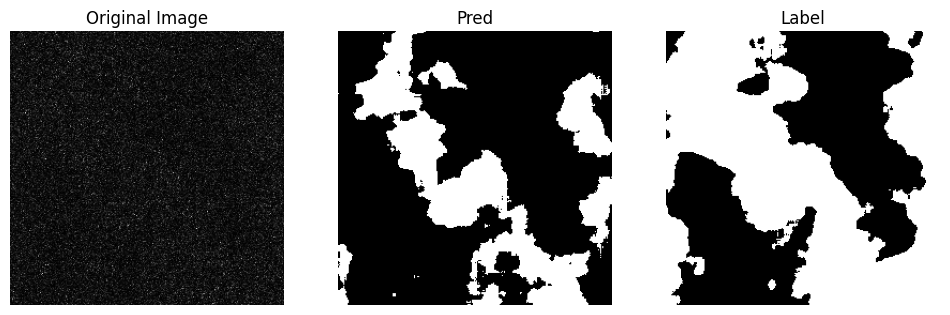

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


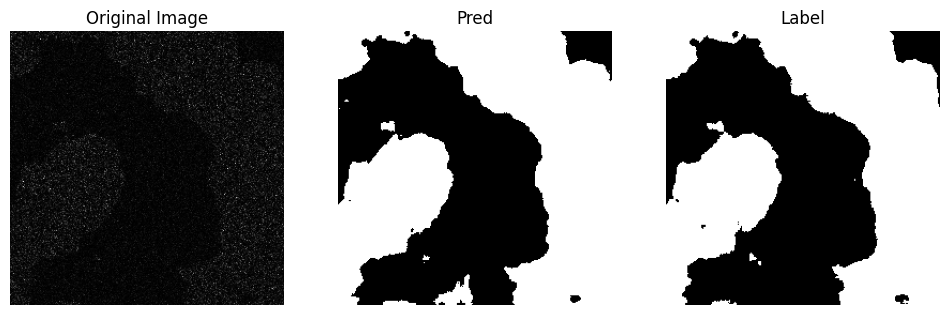

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


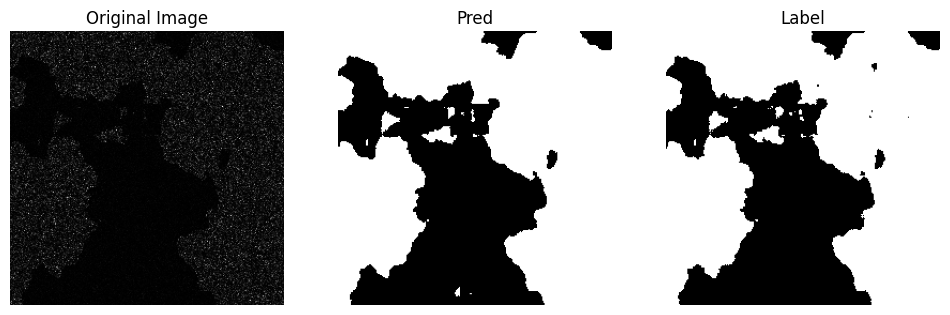

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


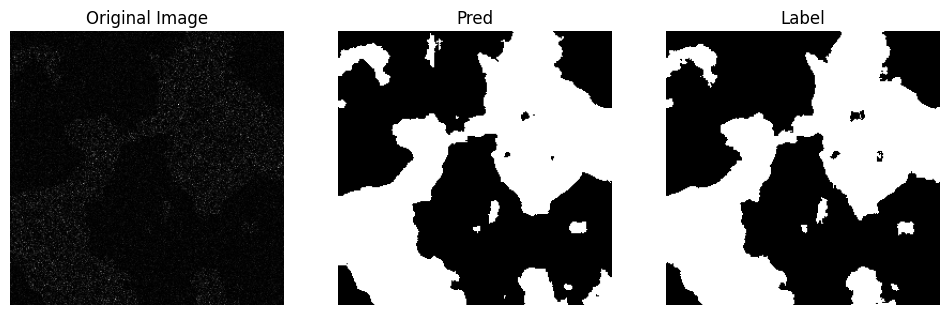

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


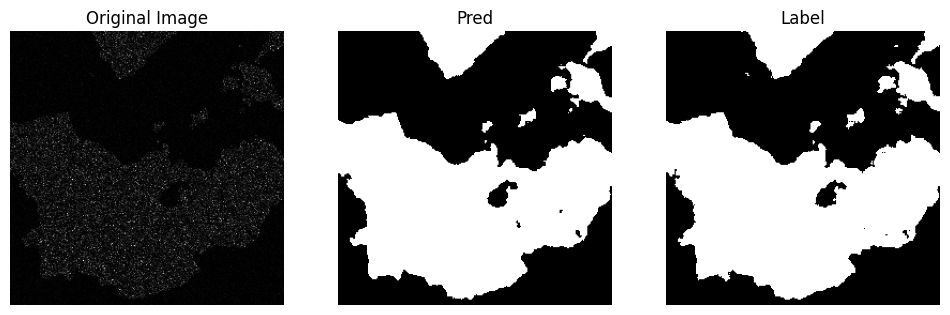

<Figure size 640x480 with 0 Axes>

StatSegMapper1:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


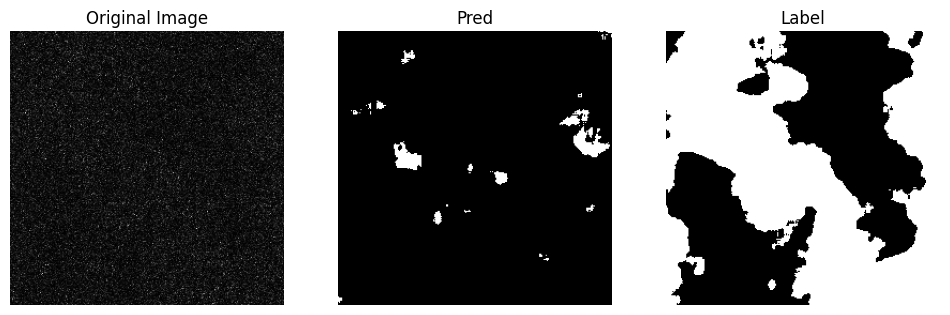

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


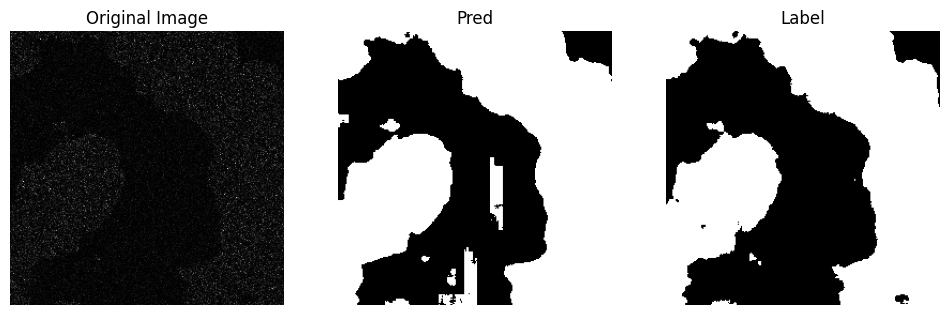

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


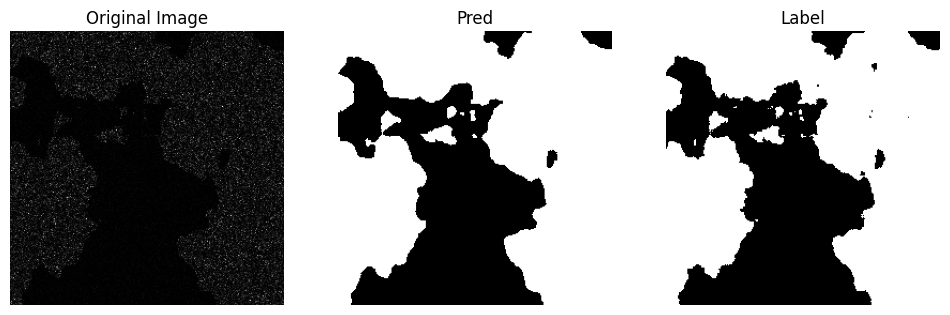

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


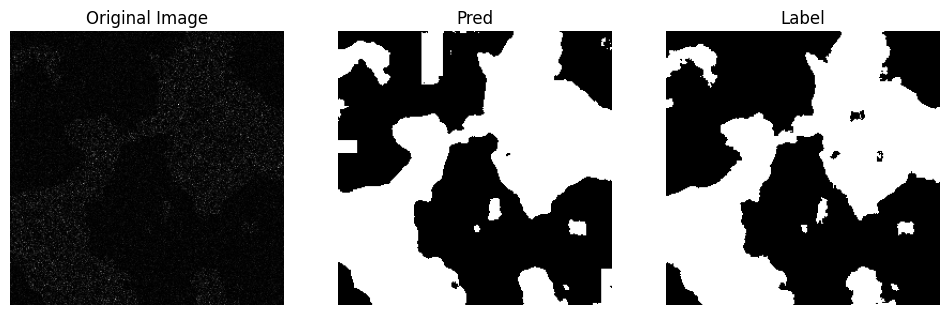

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


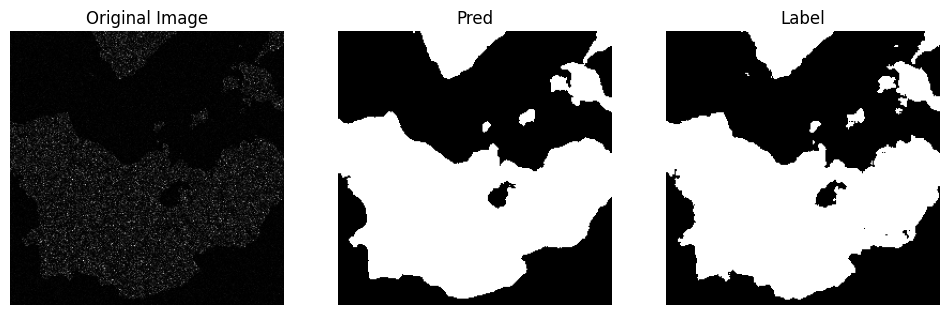

<Figure size 640x480 with 0 Axes>

StatSegMapper2:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


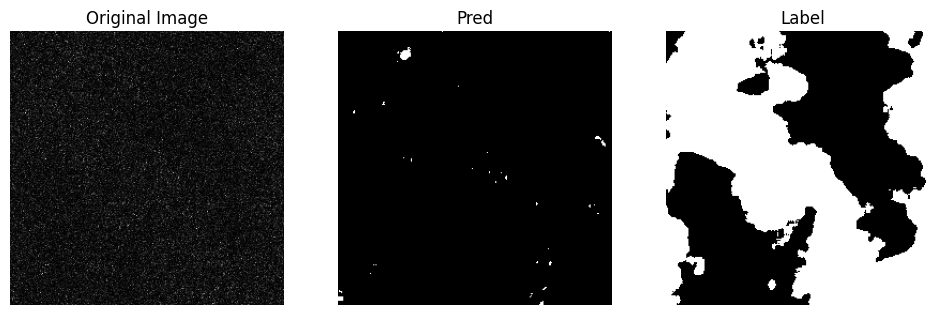

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


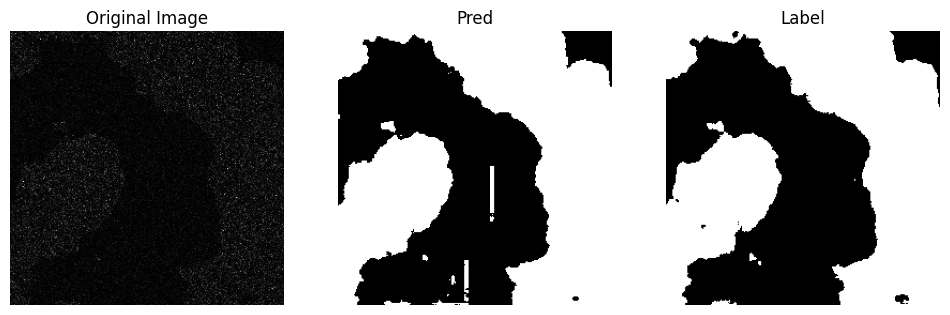

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


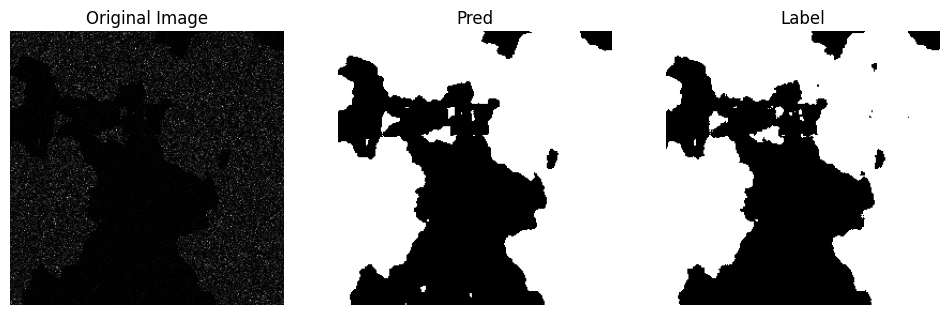

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


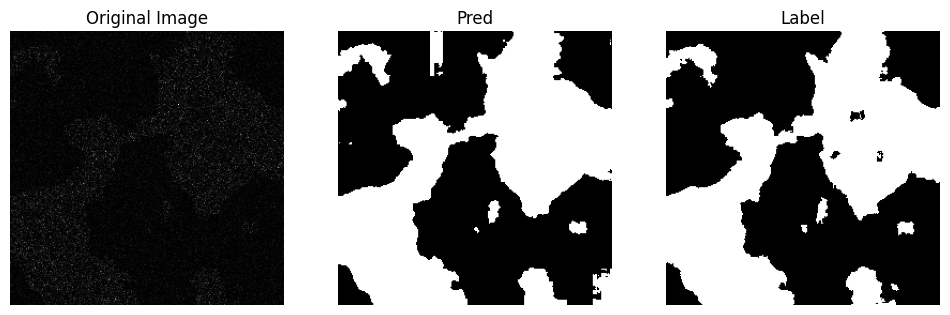

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


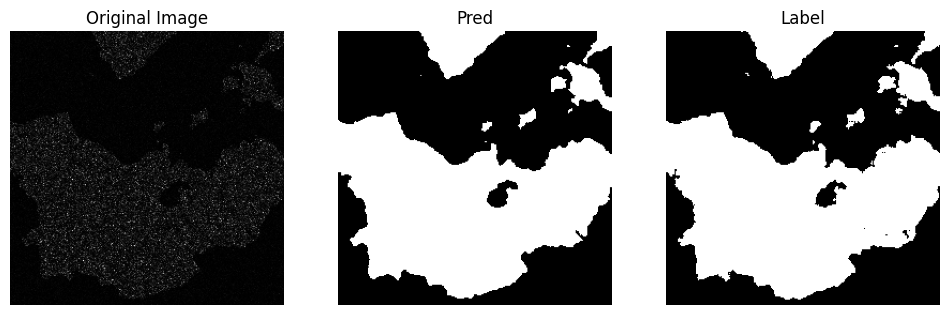

<Figure size 640x480 with 0 Axes>

StatSegMapper3:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


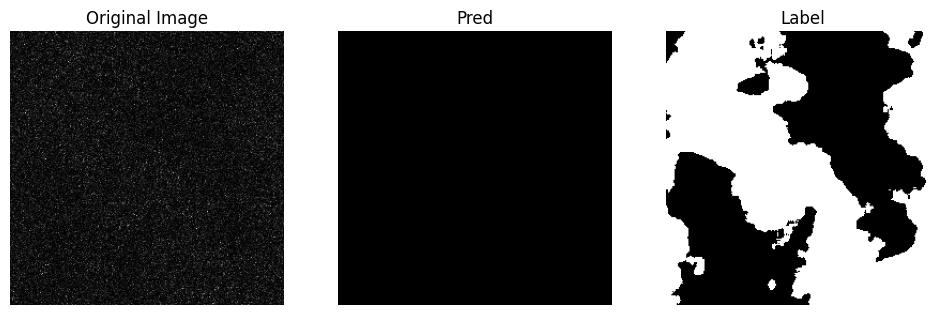

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


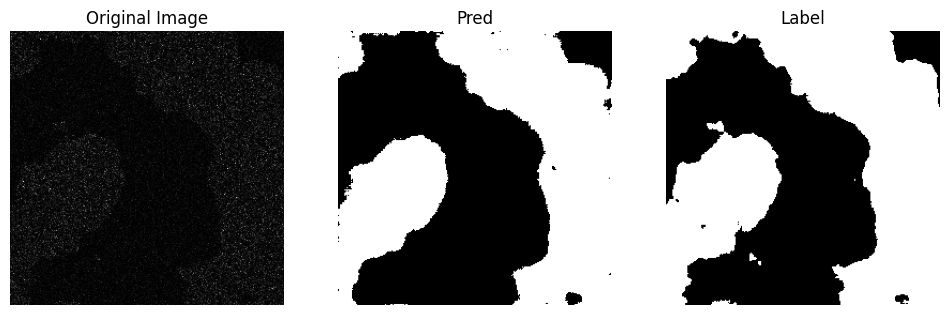

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


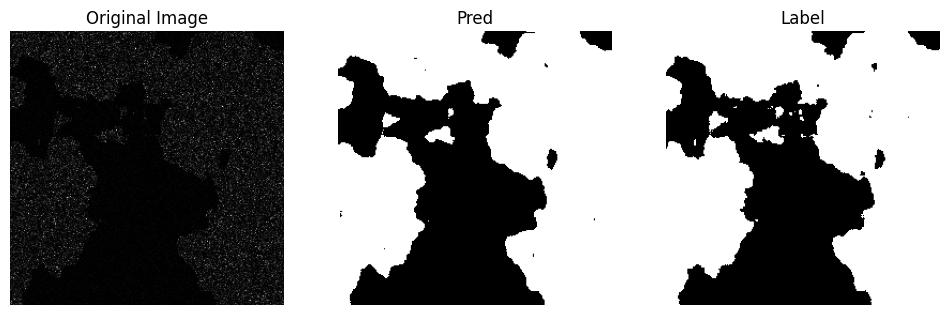

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


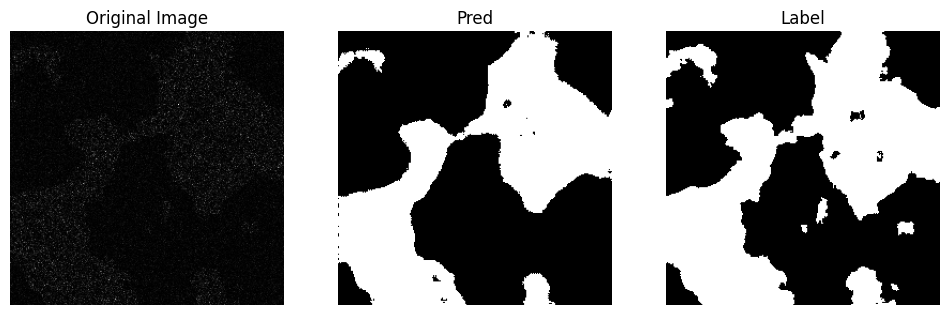

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


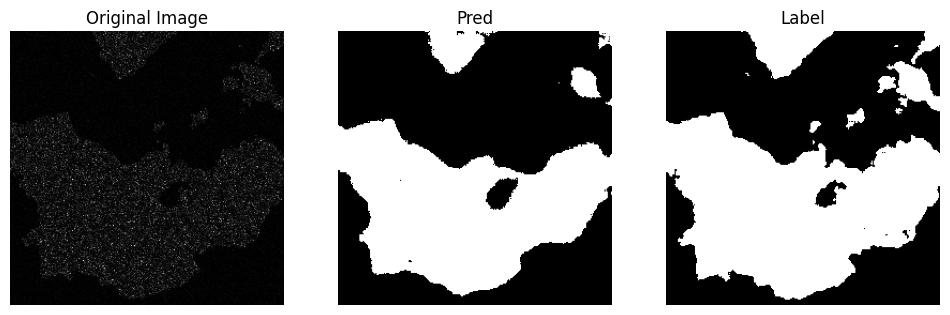

<Figure size 640x480 with 0 Axes>

StatSegMapper4:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


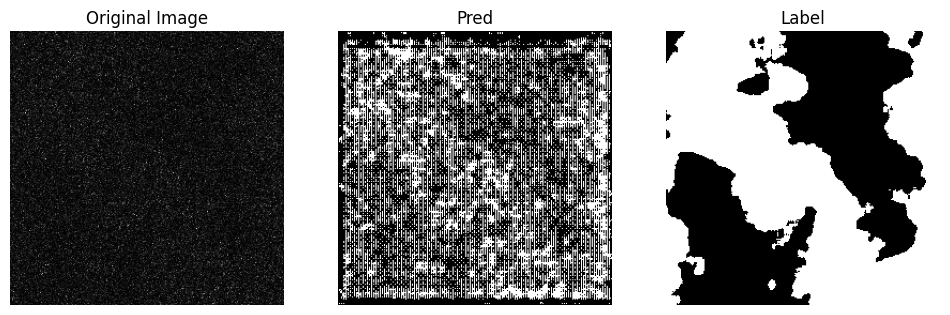

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


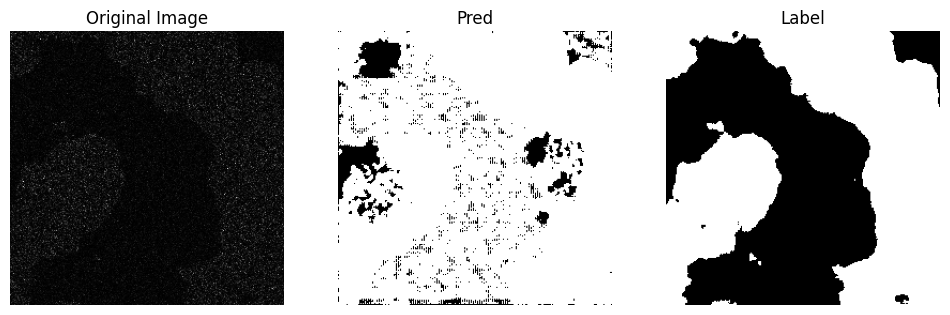

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


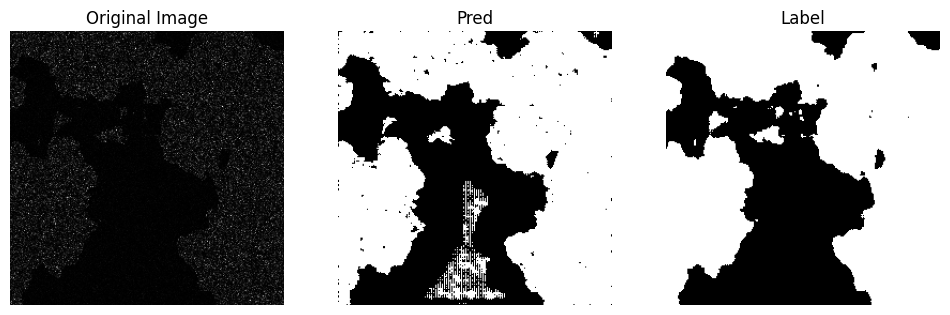

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


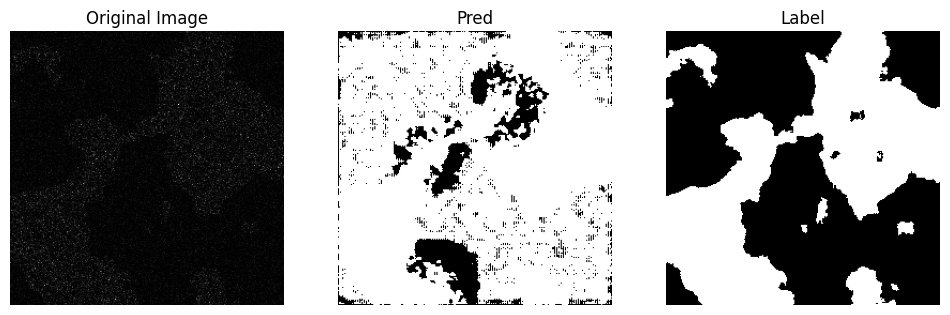

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


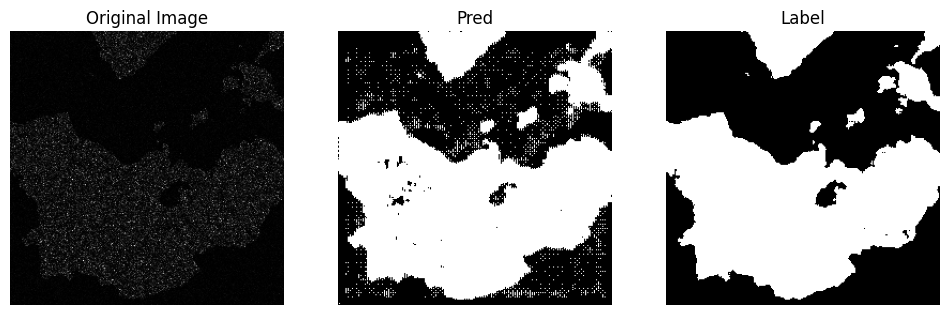

<Figure size 640x480 with 0 Axes>

StatSegMapper5:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


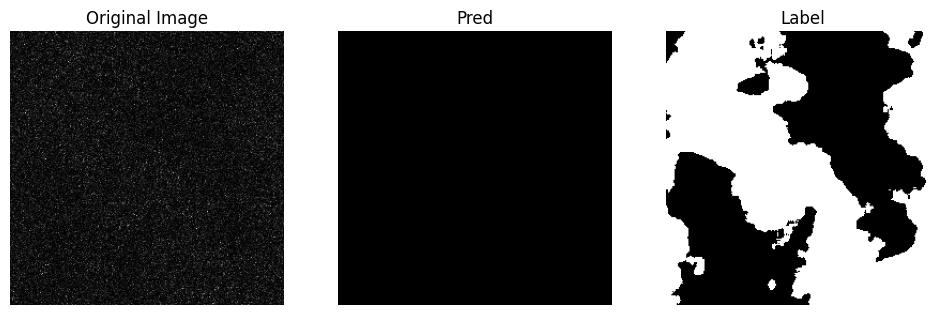

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


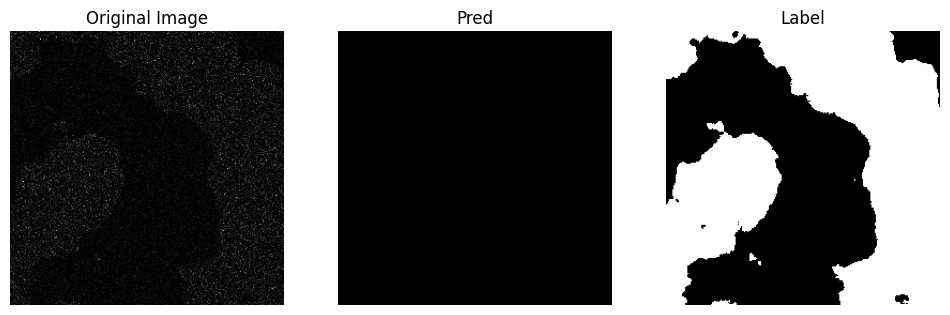

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


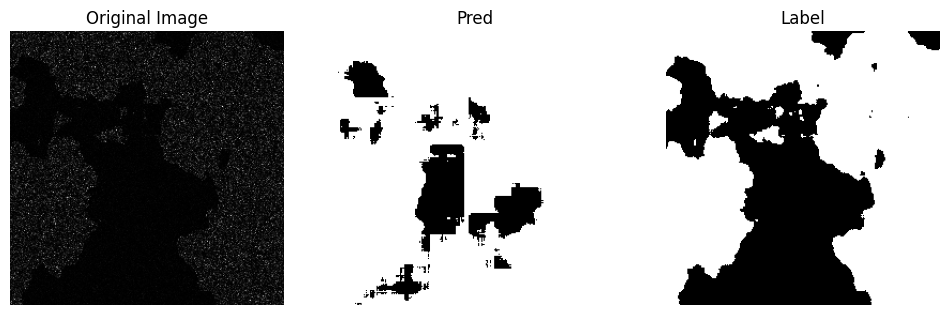

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


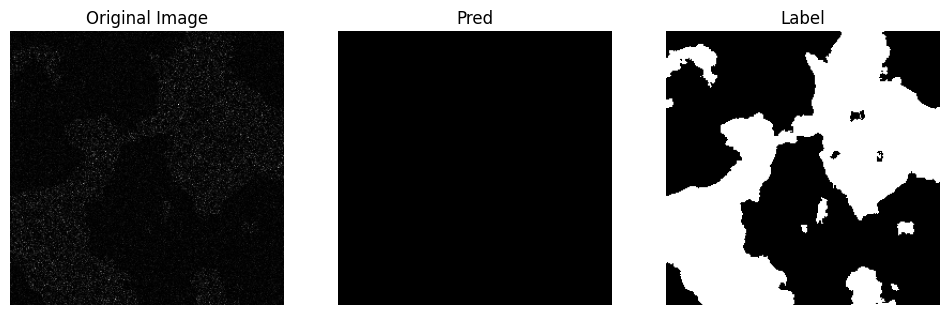

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


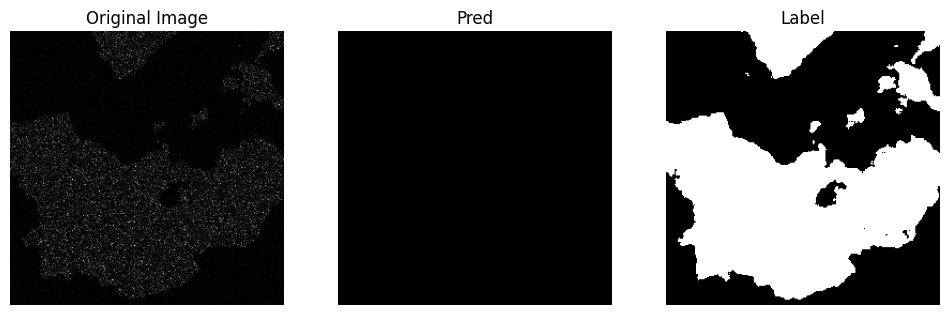

<Figure size 640x480 with 0 Axes>

StatSegMapper6:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


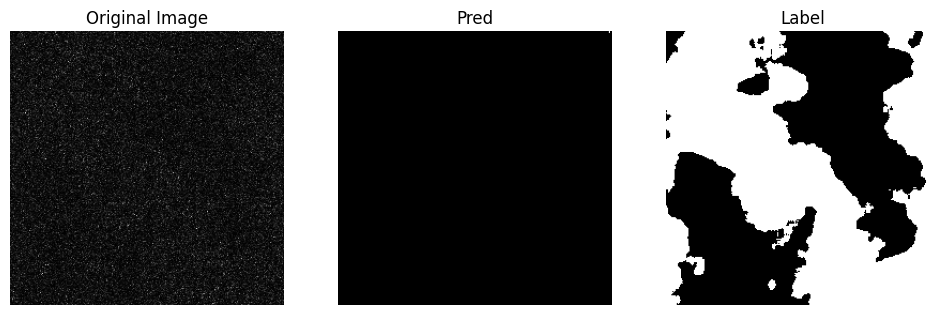

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


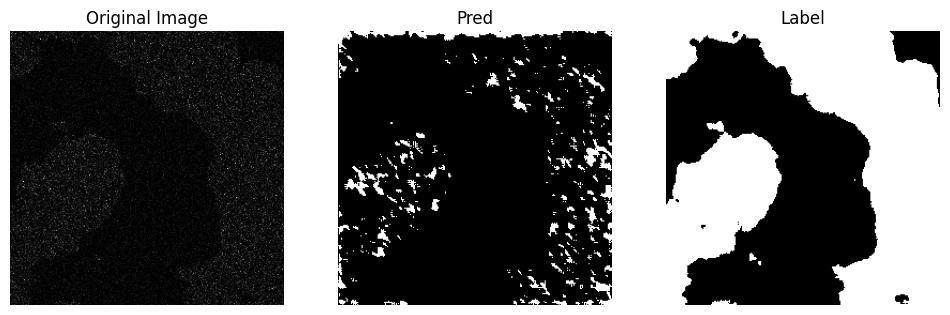

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


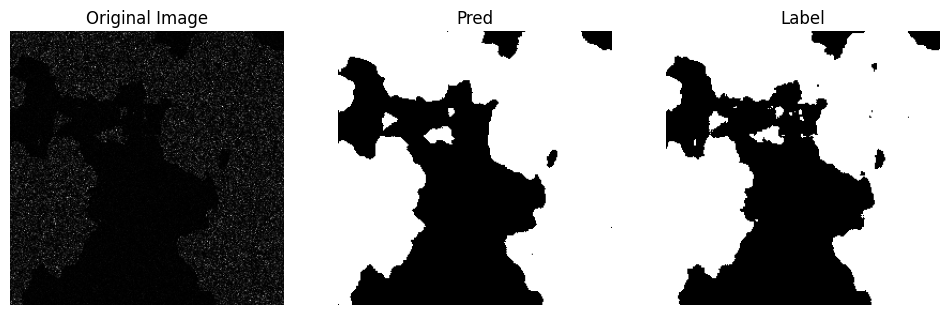

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


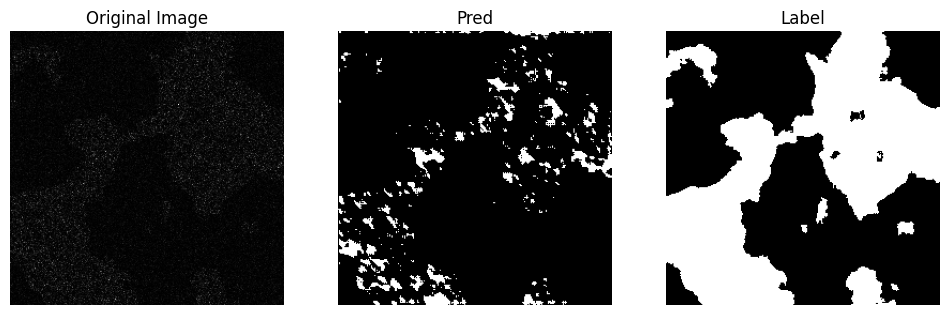

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


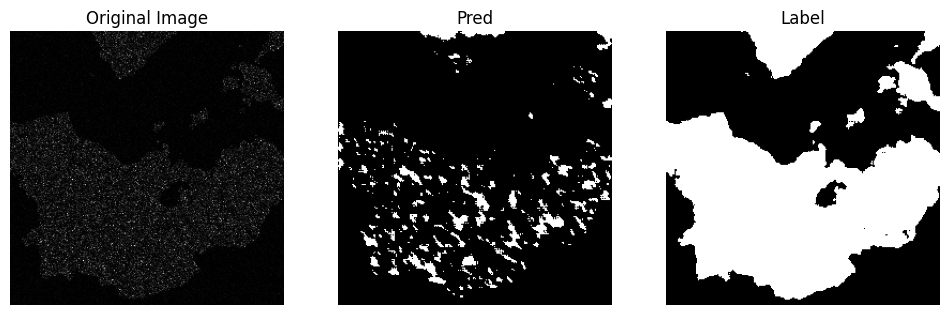

<Figure size 640x480 with 0 Axes>

StatSegMapper7:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


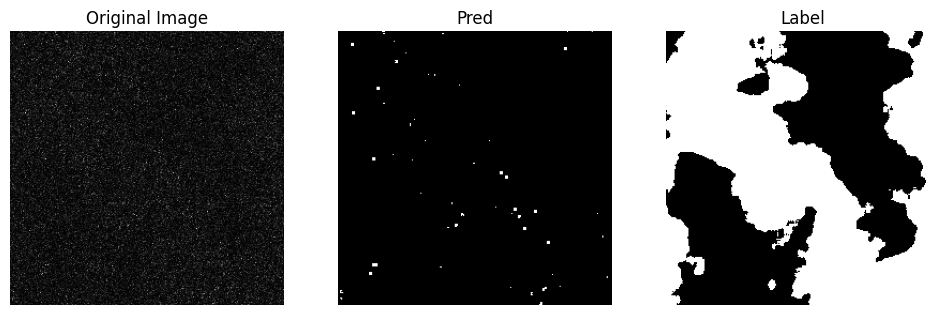

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


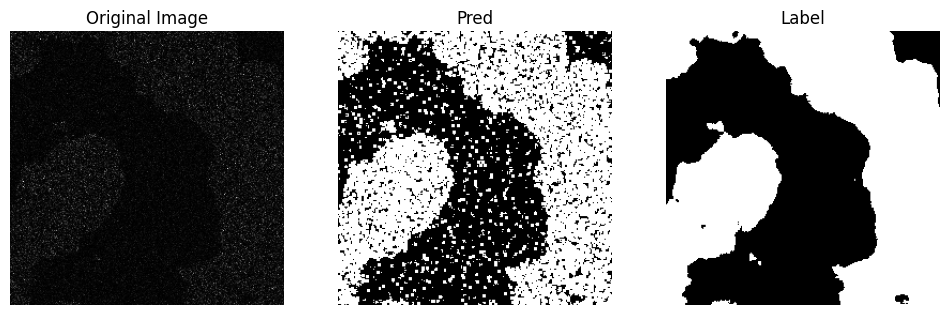

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


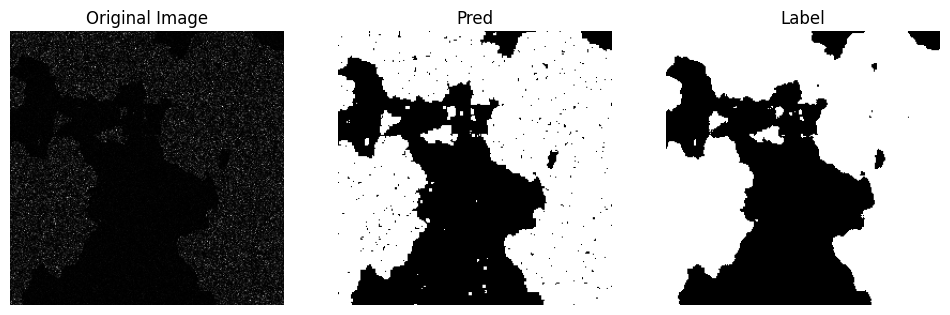

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


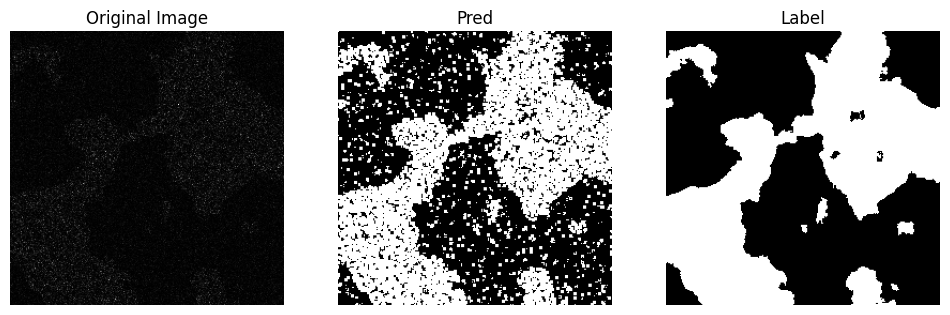

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


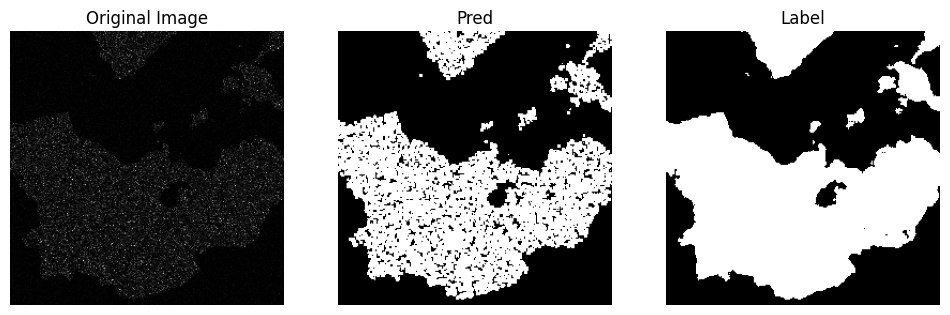

<Figure size 640x480 with 0 Axes>

StatSegMapper8:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


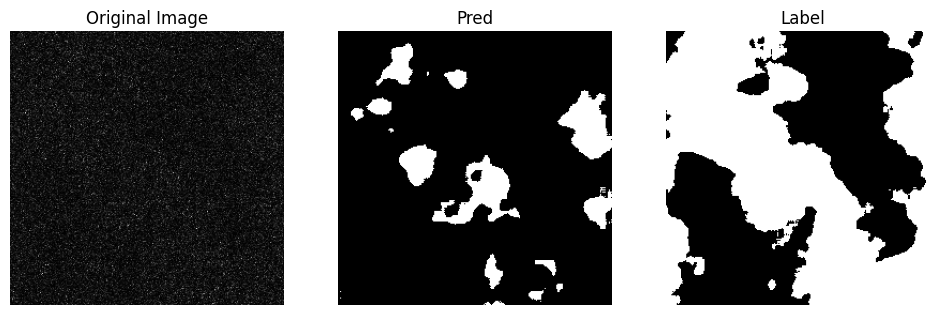

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


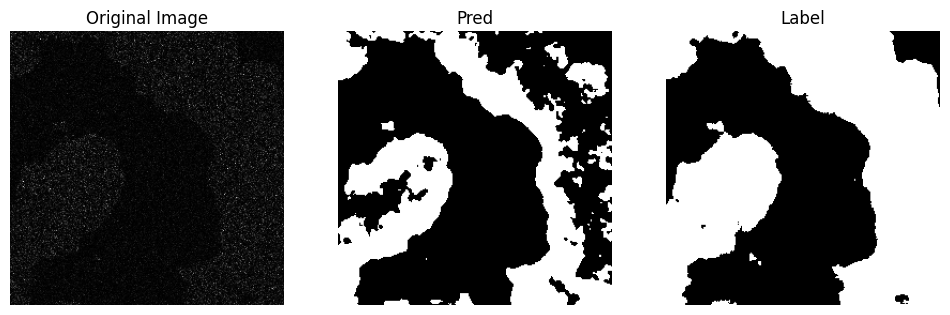

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


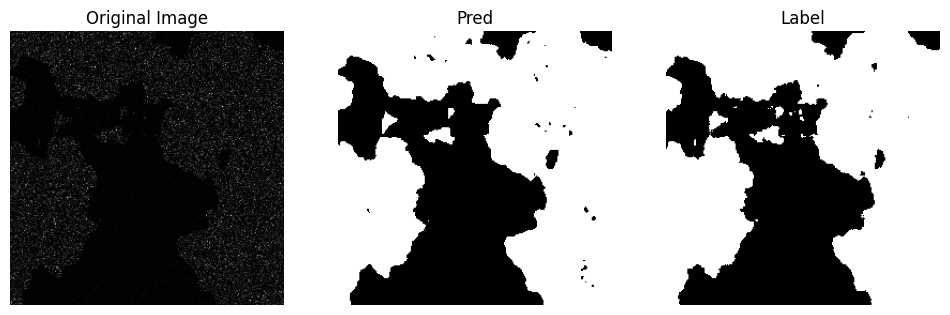

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


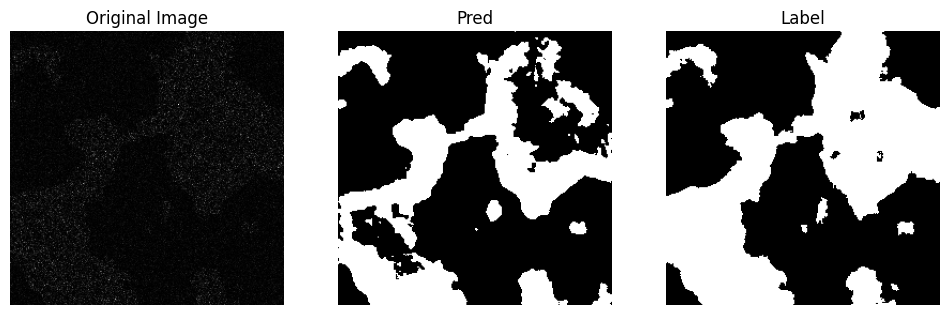

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


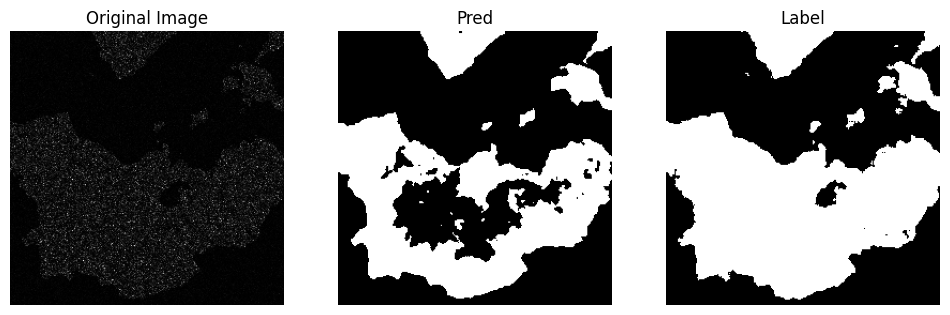

<Figure size 640x480 with 0 Axes>

StatSegMapper9:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


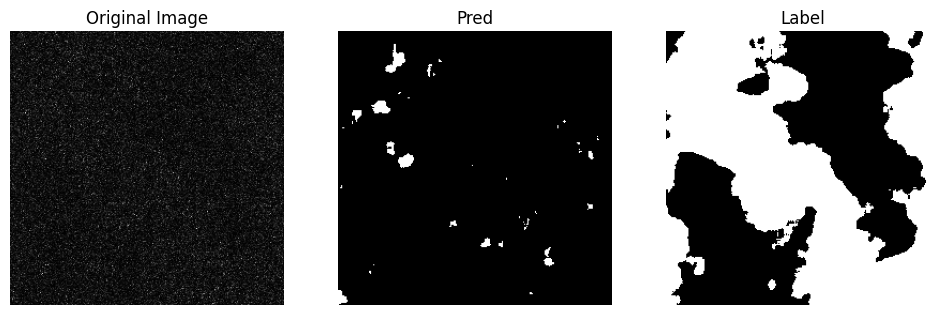

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


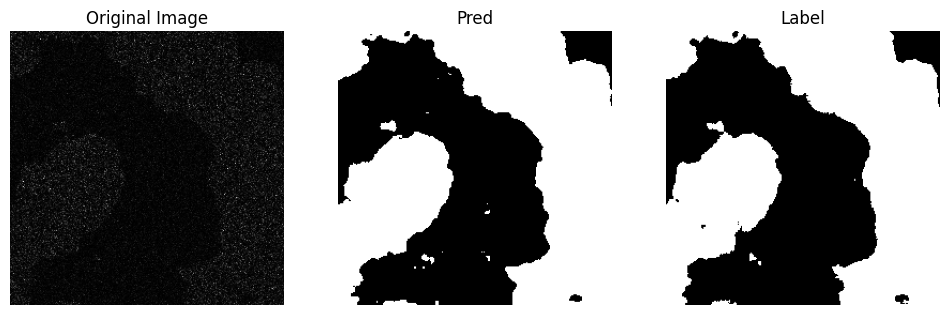

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


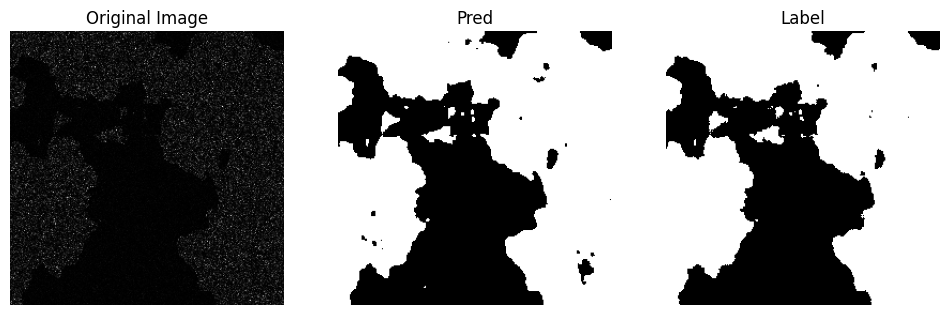

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


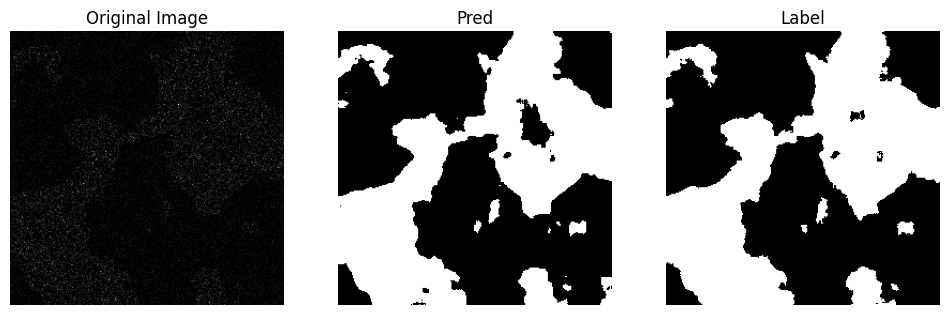

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


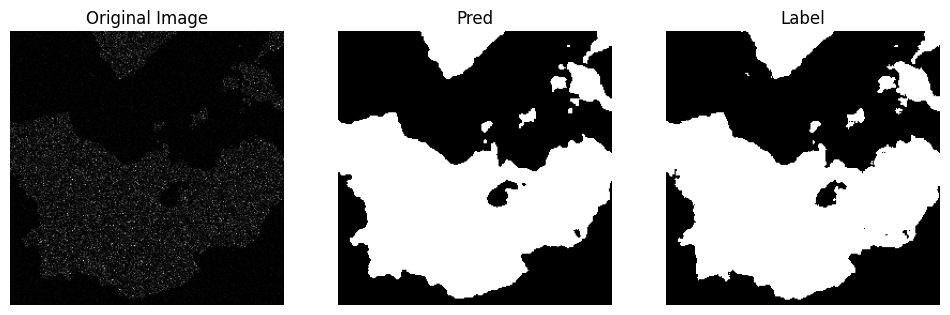

<Figure size 640x480 with 0 Axes>

StatSegMapper10:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


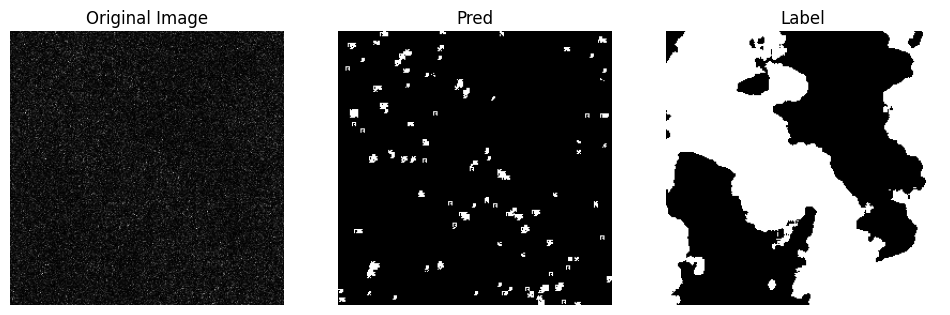

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


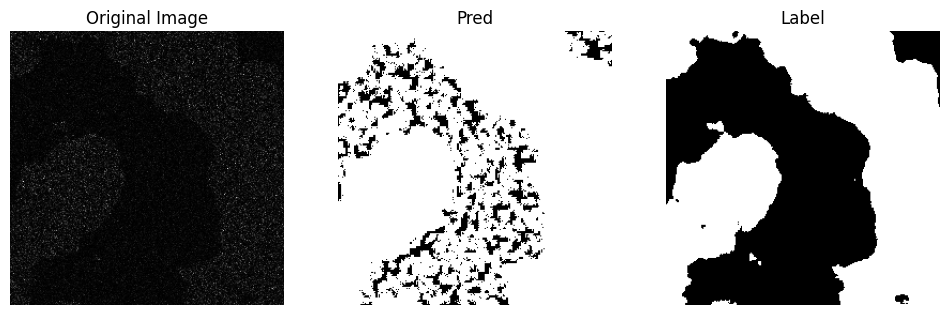

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


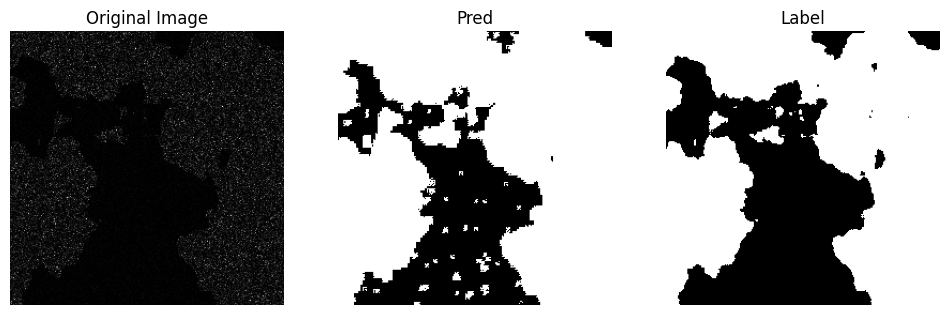

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


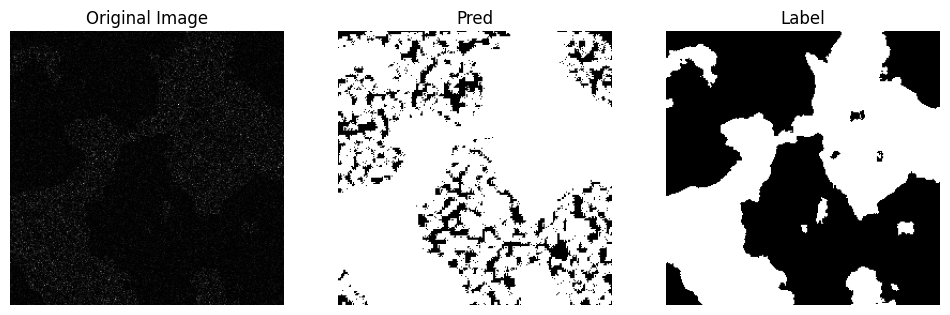

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


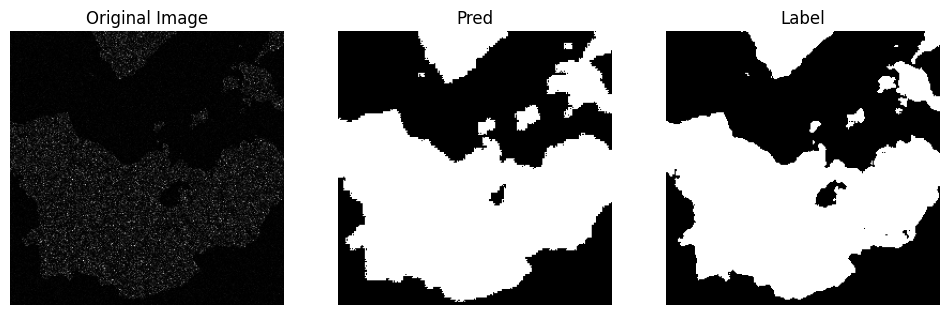

<Figure size 640x480 with 0 Axes>

StatSegMapper11:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


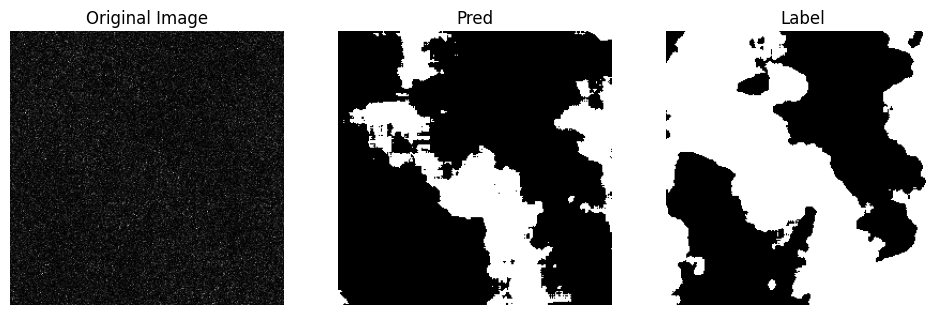

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


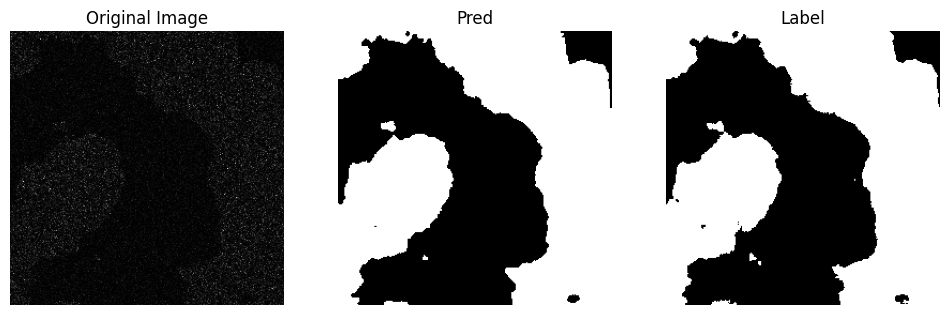

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


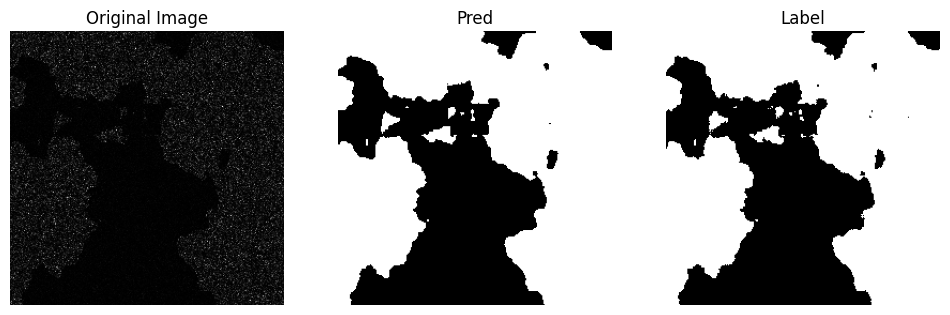

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


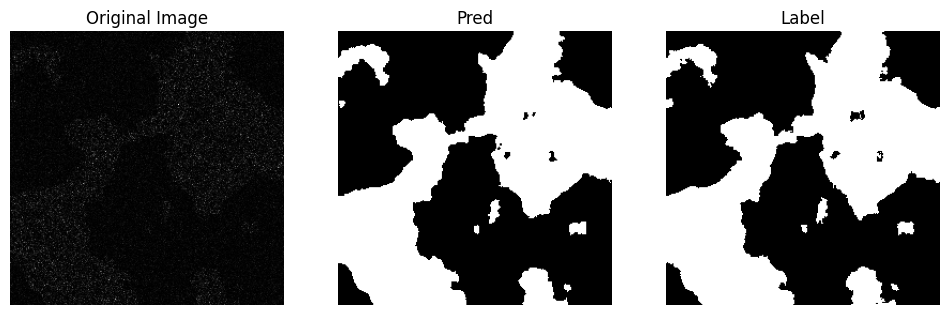

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


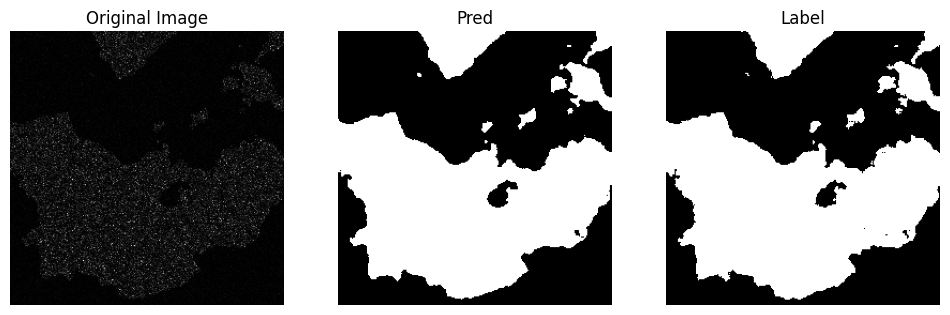

<Figure size 640x480 with 0 Axes>

StatSegMapper12:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


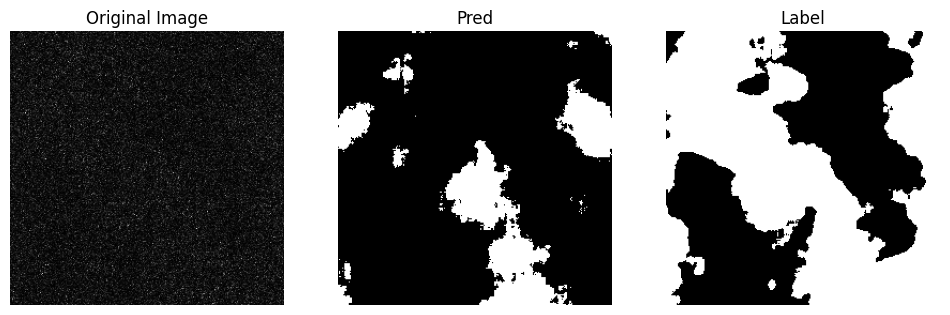

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


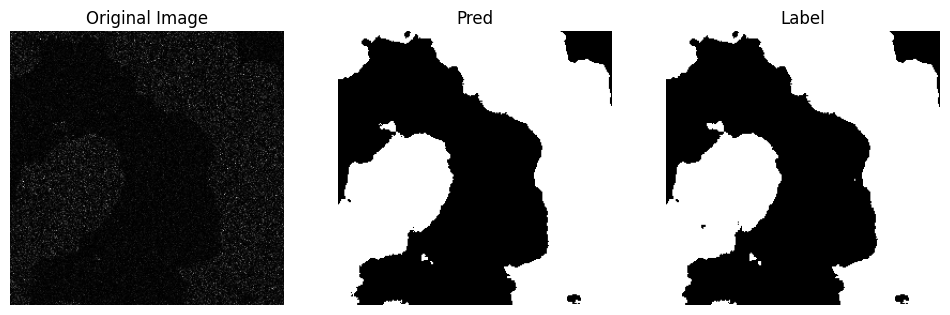

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


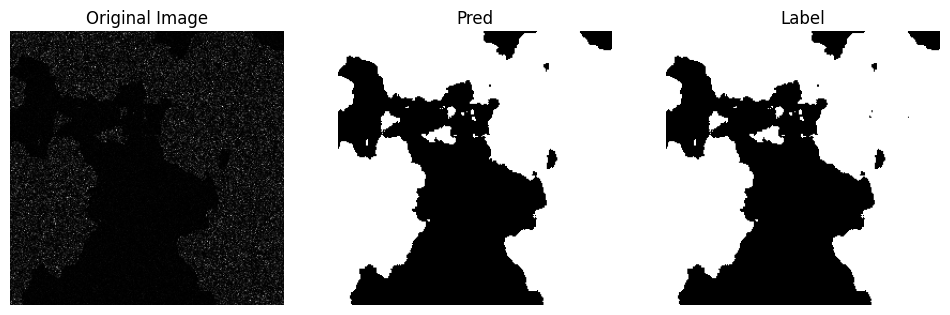

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


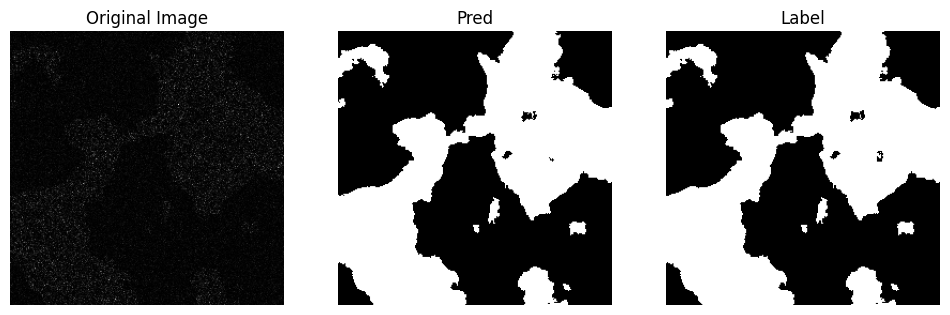

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


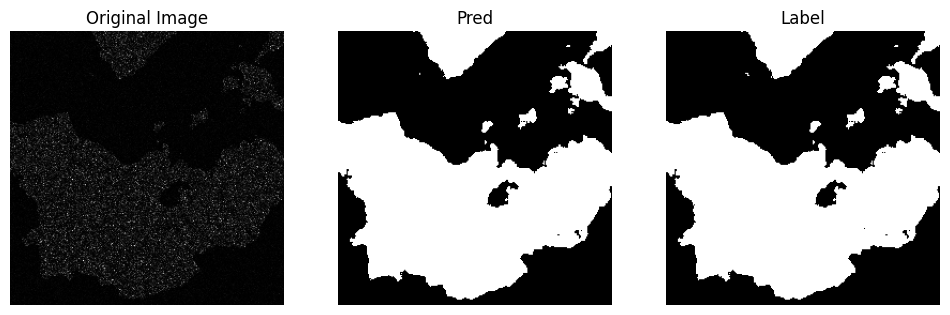

<Figure size 640x480 with 0 Axes>

StatSegMapper13:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


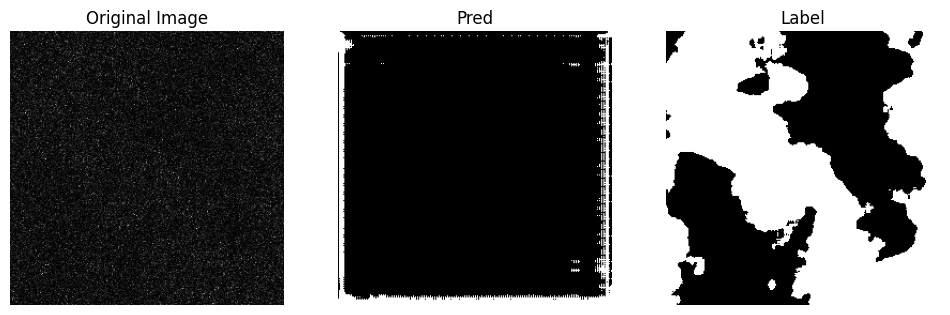

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


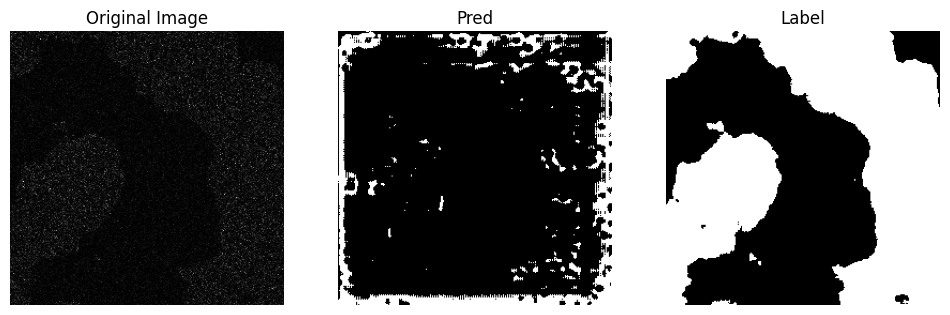

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


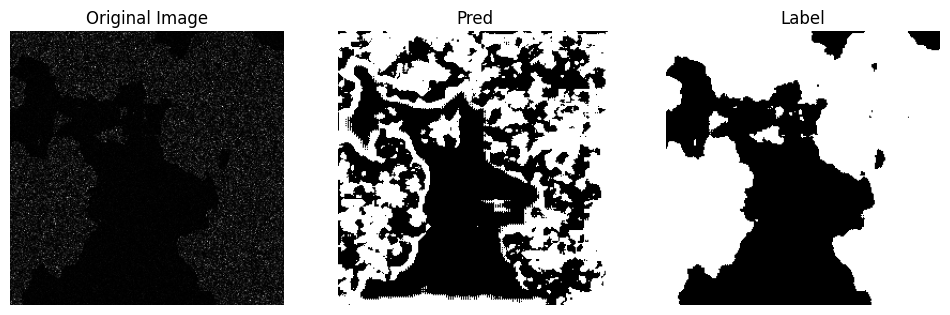

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


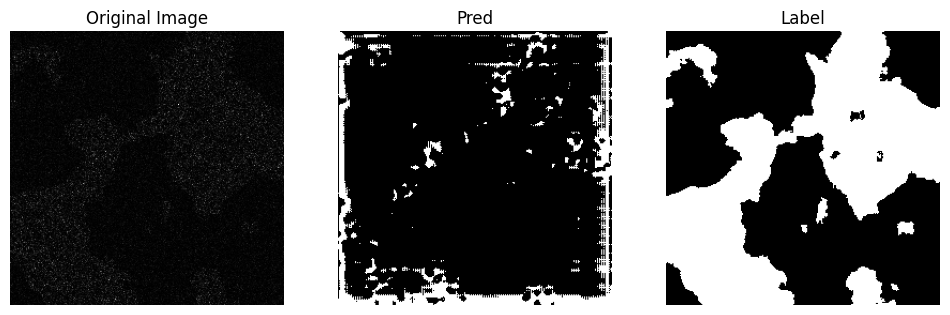

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


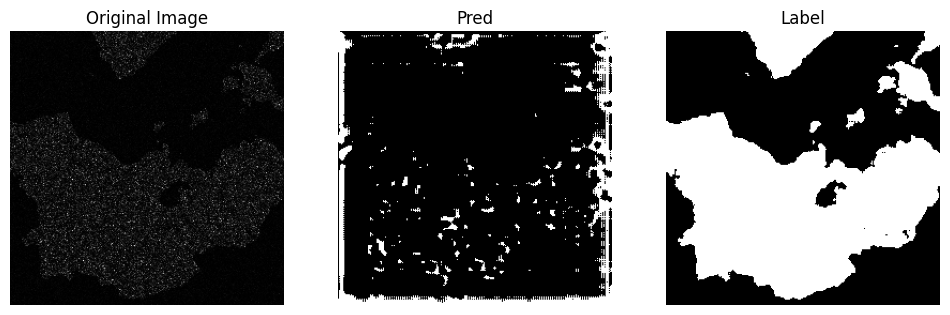

<Figure size 640x480 with 0 Axes>

StatSegMapper14:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


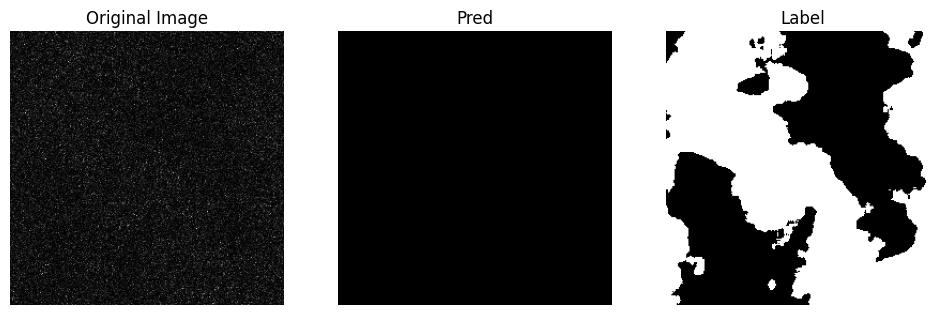

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


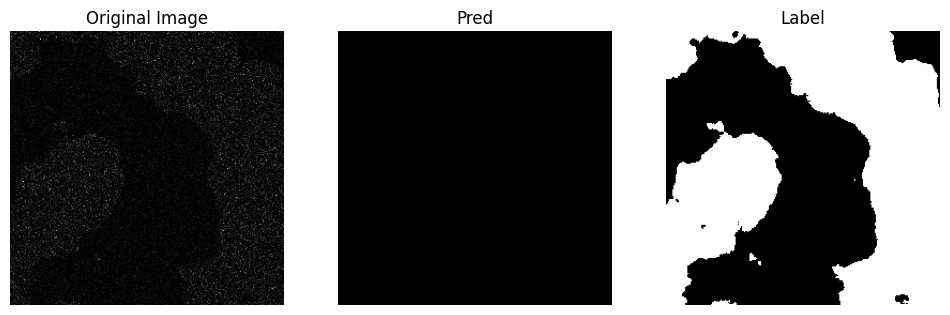

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


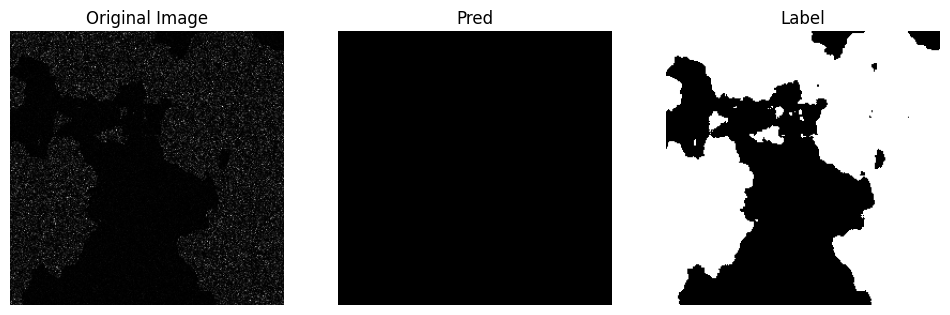

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


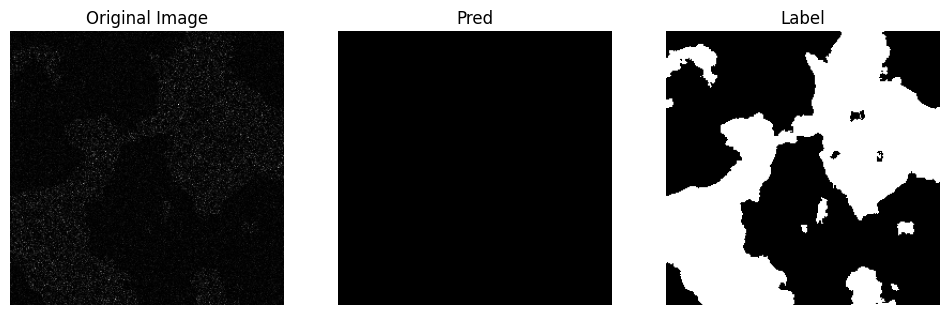

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


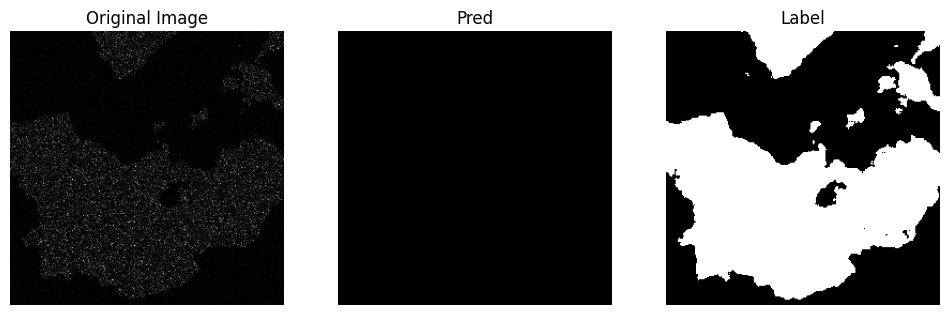

<Figure size 640x480 with 0 Axes>

StatSegMapper15:


Testing Examples:
alpha1 = -6.0, alpha2 = -7


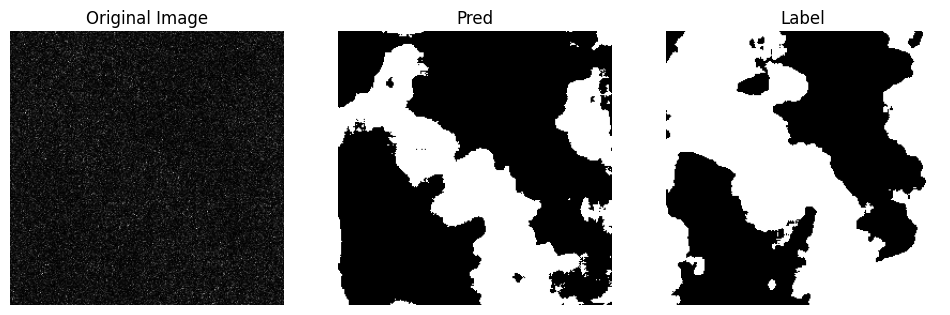

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


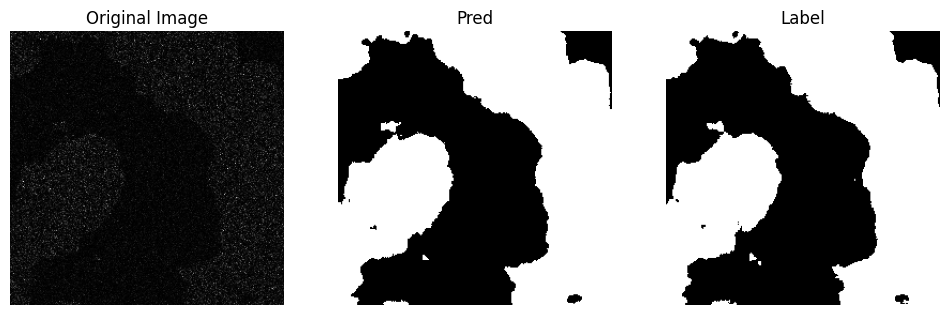

<Figure size 640x480 with 0 Axes>

alpha1 = -1.5, alpha2 = -6


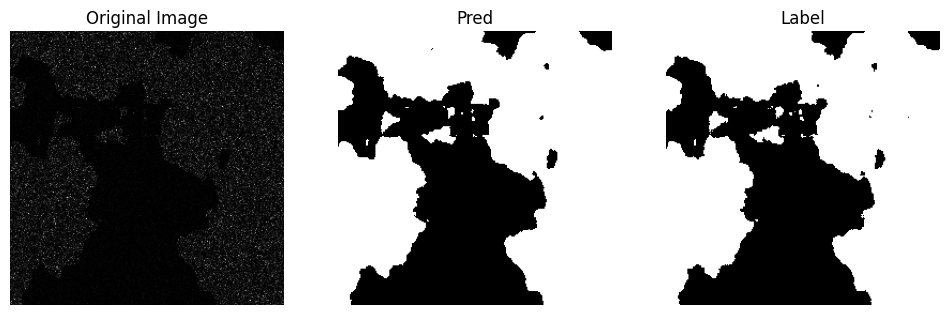

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -4


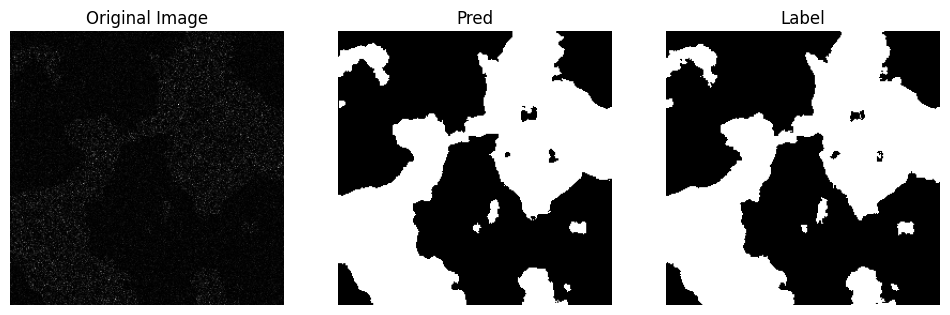

<Figure size 640x480 with 0 Axes>

alpha1 = -2.0, alpha2 = -11


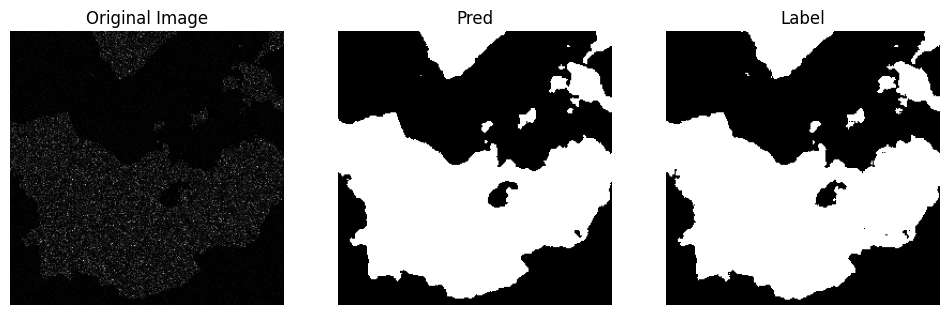

<Figure size 640x480 with 0 Axes>

In [ ]:
def test_model(model, model_name, test_function):
  print(f'{model_name}:')
  model.load_state_dict(torch.load(f'{base_dir}/Models/{model_name}.pth', map_location=torch.device(DEVICE)))
  test_function(model, model_name)

unet = UNet()
model1 = StatisticalSegmentationMapper1()
model2 = StatisticalSegmentationMapper2()
model3 = StatisticalSegmentationMapper3()
model4 = StatisticalSegmentationMapper4()
model5 = StatisticalSegmentationMapper5()
model6 = StatisticalSegmentationMapper6()
model7 = StatisticalSegmentationMapper7()
model8 = StatisticalSegmentationMapper8()
model9 = StatisticalSegmentationMapper9()
model10 = StatisticalSegmentationMapper10()
model11 = StatisticalSegmentationMapper11()
model12 = StatisticalSegmentationMapper12()
model13 = StatisticalSegmentationMapper13()
model14 = StatisticalSegmentationMapper14()
model15 = StatisticalSegmentationMapper15()

#prints tests on synthetic data
test_model(unet, "UNet", show_results)
test_model(model1, "StatSegMapper1", show_results)
test_model(model2, "StatSegMapper2", show_results)
test_model(model3, "StatSegMapper3", show_results)
test_model(model4, "StatSegMapper4", show_results)
test_model(model5, "StatSegMapper5", show_results)
test_model(model6, "StatSegMapper6", show_results)
test_model(model7, "StatSegMapper7", show_results)
test_model(model8, "StatSegMapper8", show_results)
test_model(model9, "StatSegMapper9", show_results)
test_model(model10, "StatSegMapper10", show_results)
test_model(model11, "StatSegMapper11", show_results)
test_model(model12, "StatSegMapper12", show_results)
test_model(model13, "StatSegMapper13", show_results)
test_model(model14, "StatSegMapper14", show_results)
test_model(model15, "StatSegMapper15", show_results)